In [36]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
full_df = pd.read_csv('complete_df_2.csv')

In [4]:
#full_df

In [5]:
name_list = full_df['team'].unique()

In [6]:
opp_col = ['golddiffat10', 'xpdiffat10', 'csdiffat10', 'golddiffat15', 'xpdiffat15', 'csdiffat15']
col = []

col_names = full_df.columns

In [7]:
for column in col_names:
    if column[:4] == 'opp_' or column[:4] == 'red_':
        opp_col.append(column)
    else:
        col.append(column)

In [8]:
blue_teams = full_df[col]

In [9]:
#blue_teams

In [10]:
red_teams = full_df[opp_col]
#red_teams

In [11]:
blue_teams.drop(['gameid', 'Unnamed: 0'], inplace = True, axis = 1)

D:\Anaconda\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [12]:
blue_teams['result'].replace(-1, 0, inplace = True)
#blue_teams

D:\Anaconda\lib\site-packages\pandas\core\series.py:4509: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


In [13]:
gl = blue_teams['gamelength']
wr = blue_teams['result']
red_teams['gamelength'] = gl
red_teams['result'] = wr
#red_teams

<ipython-input-13-12fb71f61c09>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_teams['gamelength'] = gl
<ipython-input-13-12fb71f61c09>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_teams['result'] = wr


In [14]:
red_teams['result'].replace(1, -1, inplace = True)
red_teams['result'].replace(0, 1, inplace = True)
red_teams['result'].replace(-1, 0, inplace = True)

In [15]:
red_teams['golddiffat10'] = red_teams['golddiffat10']*(-1)
red_teams['xpdiffat10'] = red_teams['xpdiffat10']*(-1)
red_teams['csdiffat10'] = red_teams['csdiffat10']*(-1)
red_teams['golddiffat15'] = red_teams['golddiffat15']*(-1)
red_teams['xpdiffat15'] = red_teams['xpdiffat15']*(-1)
red_teams['csdiffat15'] = red_teams['csdiffat15']*(-1)

<ipython-input-15-8232b9ee9c34>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_teams['golddiffat10'] = red_teams['golddiffat10']*(-1)
<ipython-input-15-8232b9ee9c34>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_teams['xpdiffat10'] = red_teams['xpdiffat10']*(-1)
<ipython-input-15-8232b9ee9c34>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas

In [16]:
#red_teams

In [17]:
#blue_teams.drop('result', inplace = True, axis = 1)

In [18]:
red_cols_fix = []
rc = red_teams.columns
for cols in rc:
    if cols[4:] == 'team_kpm':
        red_cols_fix.append('team kpm')
    elif cols[4:] == 'earned_gpm':
        red_cols_fix.append('earned gpm')
    elif cols[:4] == 'opp_':
        red_cols_fix.append(cols[4:])
    elif cols[:4] == 'red_':
        red_cols_fix.append(cols[4:])
    else:
        red_cols_fix.append(cols)
    
red_teams.columns = red_cols_fix

In [19]:
#red_teams

In [20]:
blue_cols_fix = []
bc = blue_teams.columns
for cols in bc:
    if cols[:5] == 'blue_':
        blue_cols_fix.append(cols[5:])
    else:
        blue_cols_fix.append(cols)

In [21]:
blue_teams.columns = blue_cols_fix

In [22]:
#blue_teams

In [23]:
"""for i in red_cols_fix:
    if i not in blue_cols_fix:
        print(i)"""

'for i in red_cols_fix:\n    if i not in blue_cols_fix:\n        print(i)'

In [24]:
missing = blue_teams[['ckpm', 'firstdragon', 'gspd']]

In [25]:
red_teams[['ckpm', 'firstdragon', 'gspd']] = missing

D:\Anaconda\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [26]:
red_teams['firstdragon'].replace(0, -1, inplace = True)
red_teams['firstdragon'].replace(1, 0, inplace = True)
red_teams['firstdragon'].replace(-1, 1, inplace = True)

In [27]:
red_teams['gspd'] = red_teams['gspd'] * (-1)

<ipython-input-27-ca2d83893a35>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_teams['gspd'] = red_teams['gspd'] * (-1)


In [28]:
worlds_matches = pd.read_csv('worlds_matches_fixed.csv')
#worlds_matches

In [29]:
team_list = worlds_matches['blue_team'].unique().tolist()

In [30]:
team_stats = []
for team in team_list:
    blue_games = blue_teams[blue_teams['team'] == team]
    red_games = red_teams[red_teams['team'] == team]

    all_games = blue_games.append(red_games)
    #all_games = all_games[:len(all_games) - int(np.floor(len(all_games)*0.20))]
    
    fbsum = all_games['firstblood'].values.sum()
    fbpercentage = (fbsum*100)/len(all_games)
    
    fbGd10Percentage = (len(all_games[(all_games['firstblood'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fbsum
    fbFdrgPercentage = (len(all_games[(all_games['firstblood'] == 1) & (all_games['firstdragon'] == 1)])*100)/fbsum
    fbFhrldPercentage = (len(all_games[(all_games['firstblood'] == 1) & (all_games['firstherald'] == 1)])*100)/fbsum
    fbFtwrPercentage = (len(all_games[(all_games['firstblood'] == 1) & (all_games['firsttower'] == 1)])*100)/fbsum
    
    gd10Sum = len(all_games[all_games['golddiffat10'] > 0])
    gd10Percentage = (gd10Sum*100)/len(all_games)
    
    gd10And15Percentage = (len(all_games[(all_games['golddiffat10'] > 0) & (all_games['golddiffat15'] >0)])*100)/gd10Sum
    
    gd15Sum = len(all_games[all_games['golddiffat15'] > 0])
    gd15Percentage = (gd15Sum*100)/len(all_games)
    
    gd15Ft3Percentage = (len(all_games[(all_games['golddiffat15'] > 0) & (all_games['firsttothreetowers'] == 1)])*100)/gd15Sum
    gd15FmidtPercentage = (len(all_games[(all_games['golddiffat15'] > 0) & (all_games['firstmidtower'] == 1)])*100)/gd15Sum
    
    ft3Sum = len(all_games[all_games['firsttothreetowers'] == 1])
    ft3Percentage = (ft3Sum*100)/len(all_games)
    
    ft3FbaronPercentage = (len(all_games[(all_games['firsttothreetowers'] == 1) & (all_games['firstbaron'] == 1)])*100)/ft3Sum
    
    team_stats.append([team, fbpercentage, fbGd10Percentage, fbFdrgPercentage, fbFhrldPercentage, fbFtwrPercentage, gd10Percentage, gd10And15Percentage, gd15Percentage, gd15Ft3Percentage, gd15FmidtPercentage, ft3Percentage, ft3FbaronPercentage])
    
df = pd.DataFrame(team_stats, columns = ['team', 'FirstBlood%', 'FbGoldAt10%', 'FbFirstDragon%', 'FbFirstHerald%', 'FbFirstTower%', 'GoldAt10%',
                             'Gd10GoldAt15%', 'GoldAt15%', 'Gd15FirstTo3Towers%', 'Gd15FirstMidTower%', 'FirstTo3Towers%', 'Ft3FirstBaron%'])
df

,team,FirstBlood%,FbGoldAt10%,FbFirstDragon%,FbFirstHerald%,FbFirstTower%,GoldAt10%,Gd10GoldAt15%,GoldAt15%,Gd15FirstTo3Towers%,Gd15FirstMidTower%,FirstTo3Towers%,Ft3FirstBaron%
0,Suning,57.142857,100.000000,100.000000,50.000000,50.000000,71.428571,60.000000,71.428571,100.000000,100.000000,85.714286,50.000000
1,LGD Gaming,70.588235,91.666667,33.333333,58.333333,75.000000,70.588235,91.666667,64.705882,90.909091,81.818182,76.470588,61.538462
2,MAD Lions,48.529412,75.757576,45.454545,69.696970,69.696970,44.117647,80.000000,44.117647,76.666667,66.666667,48.529412,63.636364
3,PSG Talon,34.090909,80.000000,46.666667,80.000000,66.666667,59.090909,80.769231,63.636364,67.857143,67.857143,50.000000,68.181818
4,Legacy Esports,56.060606,86.486486,59.459459,70.270270,78.378378,65.151515,88.372093,63.636364,83.333333,73.809524,57.575758,81.578947
5,Team Liquid,43.333333,84.615385,65.384615,53.846154,69.230769,58.333333,85.714286,55.000000,72.727273,72.727273,51.666667,83.870968
6,Rainbow7,50.000000,83.333333,40.000000,60.000000,50.000000,63.333333,81.578947,60.000000,72.222222,69.444444,51.666667,67.741935
7,INTZ,47.540984,75.862069,48.275862,48.275862,58.620690,45.901639,89.285714,47.540984,86.206897,72.413793,50.819672,70.967742
8,V3 Esports,64.150943,88.235294,58.823529,70.588235,70.588235,62.264151,90.909091,56.603774,96.666667,80.000000,56.603774,76.666667
9,Unicorns Of Love.CIS,61.111111,81.818182,66.666667,72.727273,84.848485,68.518519,94.594595,74.074074,92.500000,87.500000,77.777778,80.952381


D:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


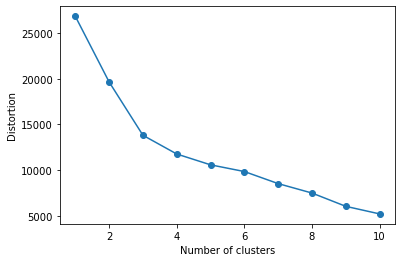

In [31]:
clustering_data = df.copy()
clustering_data.drop('team', axis = 1, inplace = True)

from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
OMP_NUM_THREADS=1

distortions = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'random', n_init = 10, max_iter = 500, tol = 1e-04, random_state = 43)
    km.fit(clustering_data)
    distortions.append(km.inertia_)
    
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

In [32]:
kmeans = KMeans(n_clusters = 3).fit(clustering_data)

In [33]:
labels = pd.DataFrame(kmeans.labels_)

labeledTeams = pd.concat((df, labels), axis = 1)
labeledTeams

,team,FirstBlood%,FbGoldAt10%,FbFirstDragon%,FbFirstHerald%,FbFirstTower%,GoldAt10%,Gd10GoldAt15%,GoldAt15%,Gd15FirstTo3Towers%,Gd15FirstMidTower%,FirstTo3Towers%,Ft3FirstBaron%,0
0,Suning,57.142857,100.000000,100.000000,50.000000,50.000000,71.428571,60.000000,71.428571,100.000000,100.000000,85.714286,50.000000,2
1,LGD Gaming,70.588235,91.666667,33.333333,58.333333,75.000000,70.588235,91.666667,64.705882,90.909091,81.818182,76.470588,61.538462,1
2,MAD Lions,48.529412,75.757576,45.454545,69.696970,69.696970,44.117647,80.000000,44.117647,76.666667,66.666667,48.529412,63.636364,0
3,PSG Talon,34.090909,80.000000,46.666667,80.000000,66.666667,59.090909,80.769231,63.636364,67.857143,67.857143,50.000000,68.181818,0
4,Legacy Esports,56.060606,86.486486,59.459459,70.270270,78.378378,65.151515,88.372093,63.636364,83.333333,73.809524,57.575758,81.578947,1
5,Team Liquid,43.333333,84.615385,65.384615,53.846154,69.230769,58.333333,85.714286,55.000000,72.727273,72.727273,51.666667,83.870968,0
6,Rainbow7,50.000000,83.333333,40.000000,60.000000,50.000000,63.333333,81.578947,60.000000,72.222222,69.444444,51.666667,67.741935,0
7,INTZ,47.540984,75.862069,48.275862,48.275862,58.620690,45.901639,89.285714,47.540984,86.206897,72.413793,50.819672,70.967742,0
8,V3 Esports,64.150943,88.235294,58.823529,70.588235,70.588235,62.264151,90.909091,56.603774,96.666667,80.000000,56.603774,76.666667,1
9,Unicorns Of Love.CIS,61.111111,81.818182,66.666667,72.727273,84.848485,68.518519,94.594595,74.074074,92.500000,87.500000,77.777778,80.952381,1


In [34]:
labeledTeams['constant'] = 'Data'
labeledTeams = labeledTeams.rename({0 : 'labels'}, axis = 1)

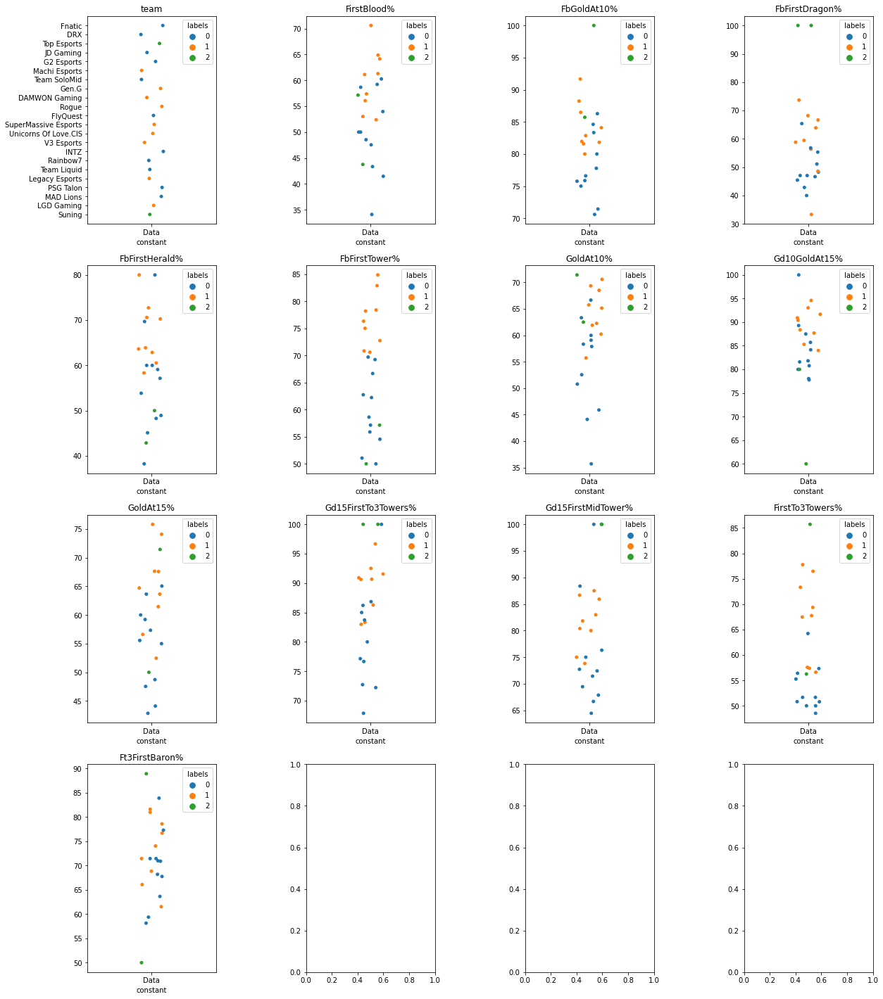

In [35]:
f, axes = plt.subplots(4, 4, figsize = (20, 25), sharex = False)
f.subplots_adjust(hspace = 0.2, wspace = 0.7)

for i in range(0, len(list(labeledTeams)) - 2):
    col = labeledTeams.columns[i]
    if i < 4:
        ax = sns.stripplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], jitter = True, ax = axes[0, (i)])
        ax.set_title(col)
    
    elif i >= 4 and i < 8:
        ax = sns.stripplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], jitter = True, ax = axes[1, (i-4)])
        ax.set_title(col)
        
    elif i >= 8 and i < 12:
        ax = sns.stripplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], jitter = True, ax = axes[2, (i-8)])
        ax.set_title(col)
        
    elif i >= 12:
        ax = sns.stripplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], jitter = True, ax = axes[3, (i-12)])
        ax.set_title(col)

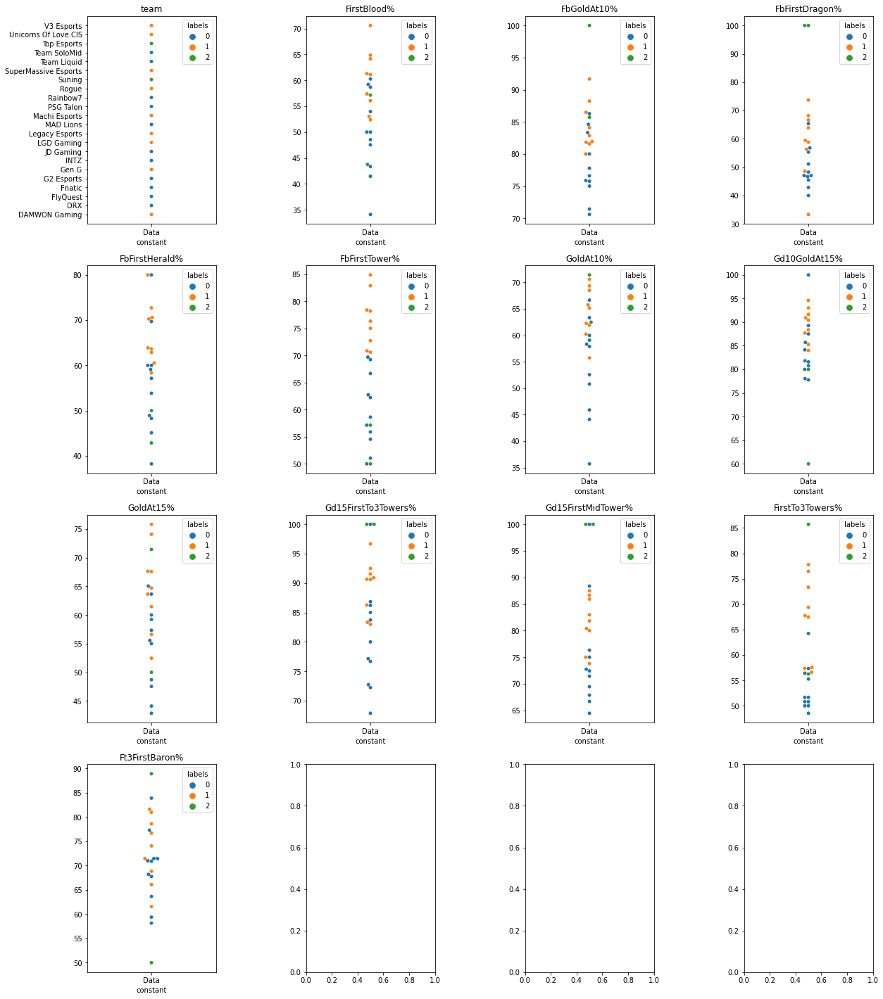

In [36]:
f, axes = plt.subplots(4, 4, figsize = (20, 25), sharex = False)
f.subplots_adjust(hspace = 0.2, wspace = 0.7)

for i in range(0, len(list(labeledTeams)) - 2):
    col = labeledTeams.columns[i]
    if i < 4:
        ax = sns.swarmplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], ax = axes[0, (i)])
        ax.set_title(col)
    
    elif i >= 4 and i < 8:
        ax = sns.swarmplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], ax = axes[1, (i-4)])
        ax.set_title(col)
        
    elif i >= 8 and i < 12:
        ax = sns.swarmplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], ax = axes[2, (i-8)])
        ax.set_title(col)
        
    elif i >= 12:
        ax = sns.swarmplot(x = labeledTeams['constant'], y = labeledTeams[col].values, 
                           hue = labeledTeams['labels'], ax = axes[3, (i-12)])
        ax.set_title(col)

In [37]:
label_0 = labeledTeams[labeledTeams['labels'] == 0].mean().tolist()
label_1 = labeledTeams[labeledTeams['labels'] == 1].mean().tolist()
label_2 = labeledTeams[labeledTeams['labels'] == 2].mean().tolist()

label_0 = label_0[:12]
label_1 = label_1[:12]
label_2 = label_2[:12]

In [38]:
categories = labeledTeams.columns.tolist()
categories = categories[:12]
categories = [*categories, categories[0]]

In [39]:
type_0 = [*label_0, label_0[0]]
type_1 = [*label_1, label_1[0]]
type_2 = [*label_2, label_2[0]]

<function matplotlib.pyplot.show(close=None, block=None)>

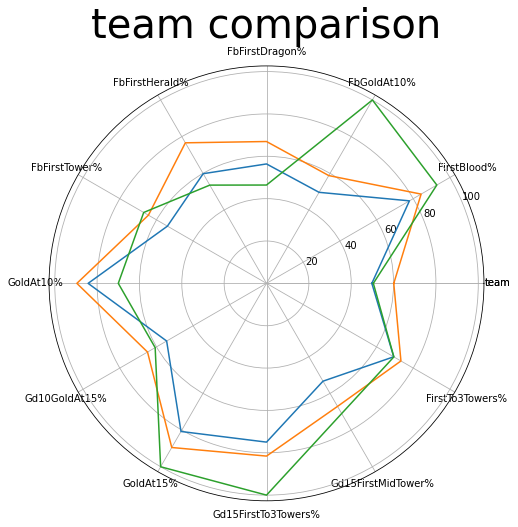

In [40]:
label_loc = np.linspace(start = 0, stop = 2 * np.pi, num=len(type_0))

plt.figure(figsize = (8,8))
plt.subplot(polar = True)
plt.plot(label_loc, type_0, label = 'type_0')
plt.plot(label_loc, type_1, label = 'type_1')
plt.plot(label_loc, type_2, label = 'type_2')
plt.title('team comparison', size = 40, y = 1.05)
lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
plt.legend
plt.show

In [41]:
labeledTeams[labeledTeams['labels'] == 0].std()

FirstBlood%             8.116196
FbGoldAt10%             5.131864
FbFirstDragon%          7.171592
FbFirstHerald%         11.633594
FbFirstTower%           6.872782
GoldAt10%               9.237741
Gd10GoldAt15%           6.400847
GoldAt15%               7.626251
Gd15FirstTo3Towers%     8.932534
Gd15FirstMidTower%     10.454147
FirstTo3Towers%         4.598928
Ft3FirstBaron%          7.409564
labels                  0.000000
dtype: float64

In [42]:
labeledTeams[labeledTeams['labels'] == 1].std()

FirstBlood%             5.969818
FbGoldAt10%             3.779265
FbFirstDragon%         12.025389
FbFirstHerald%          6.896960
FbFirstTower%           4.998456
GoldAt10%               4.813488
Gd10GoldAt15%           3.505952
GoldAt15%               7.539822
Gd15FirstTo3Towers%     4.473975
Gd15FirstMidTower%      4.864568
FirstTo3Towers%         8.229447
Ft3FirstBaron%          6.899347
labels                  0.000000
dtype: float64

In [43]:
labeledTeams[labeledTeams['labels'] == 2].std()

FirstBlood%             9.470180
FbGoldAt10%            10.101525
FbFirstDragon%          0.000000
FbFirstHerald%          5.050763
FbFirstTower%           5.050763
GoldAt10%               6.313453
Gd10GoldAt15%          14.142136
GoldAt15%              15.152288
Gd15FirstTo3Towers%     0.000000
Gd15FirstMidTower%      0.000000
FirstTo3Towers%        20.834396
Ft3FirstBaron%         27.498597
labels                  0.000000
dtype: float64

<ipython-input-44-b5a7d5114a58>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


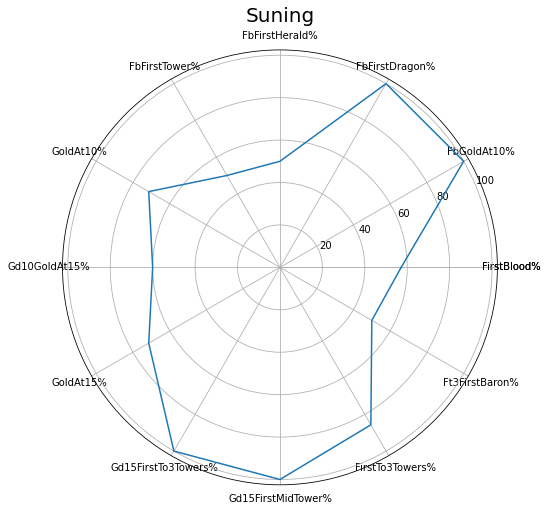

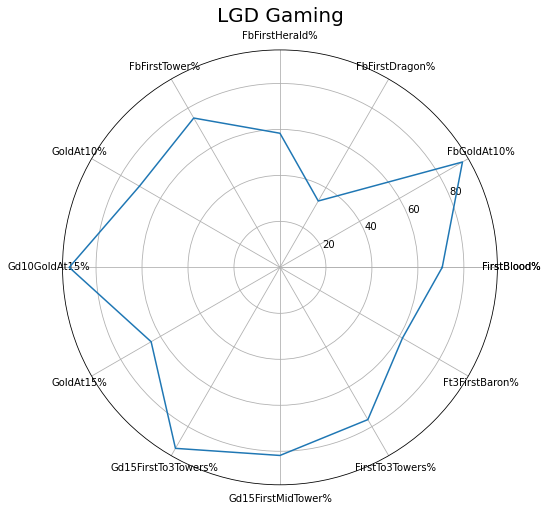

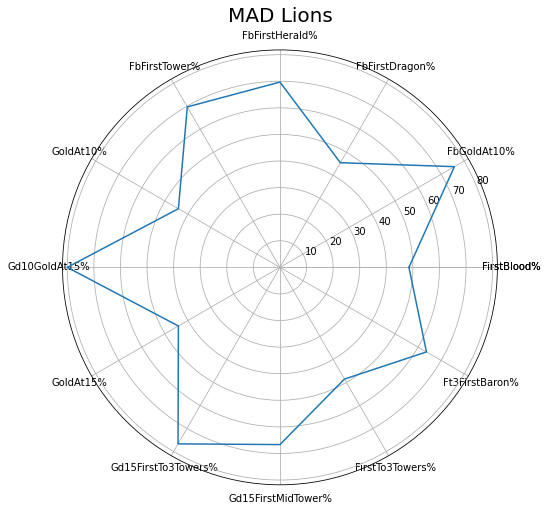

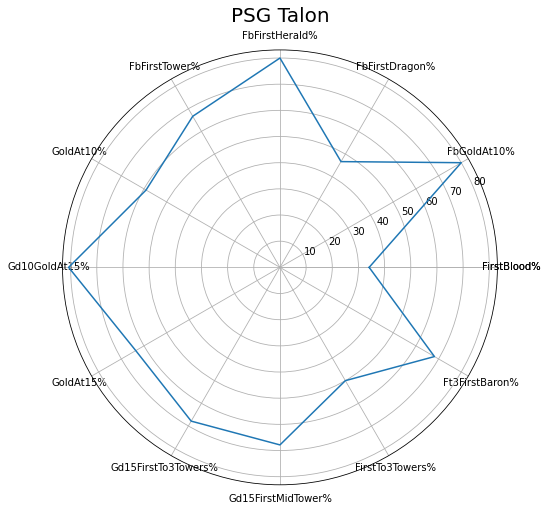

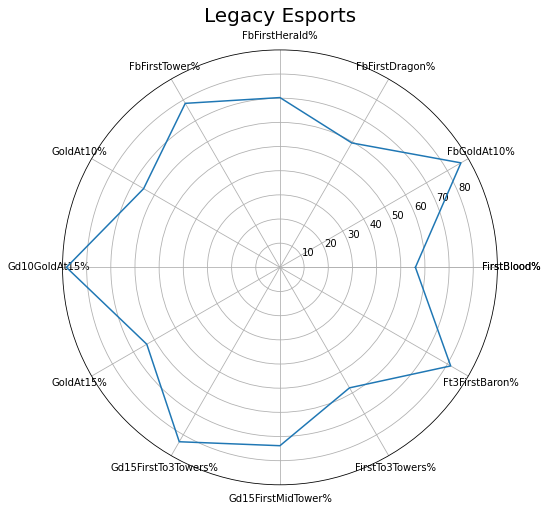

...

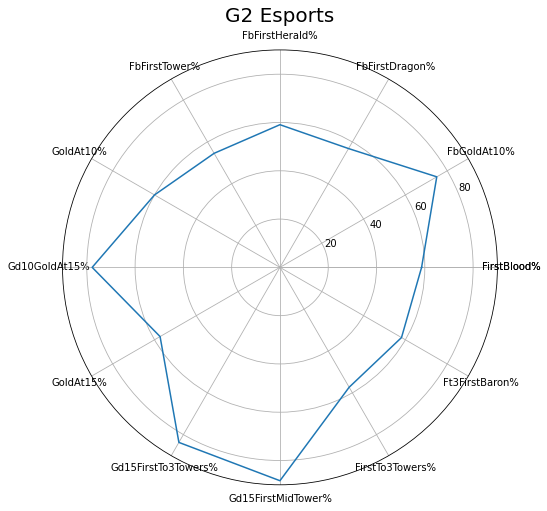

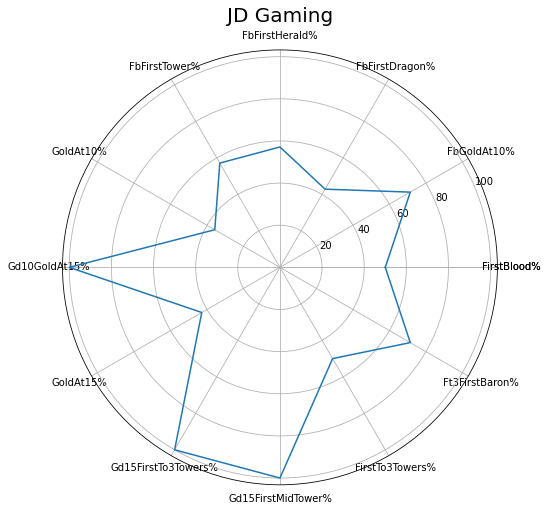

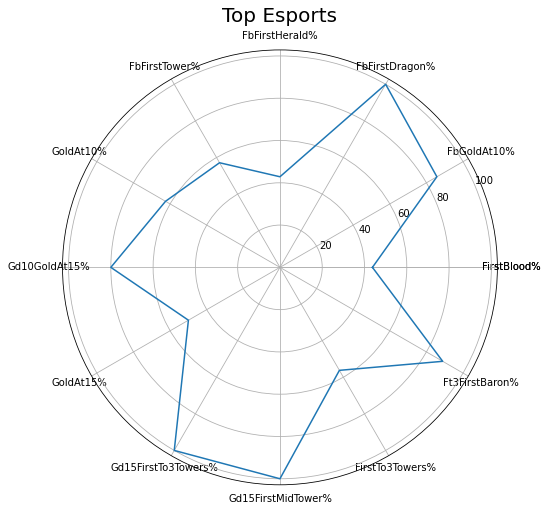

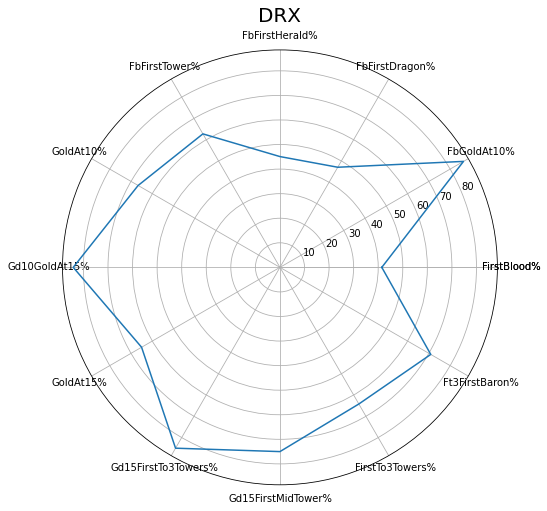

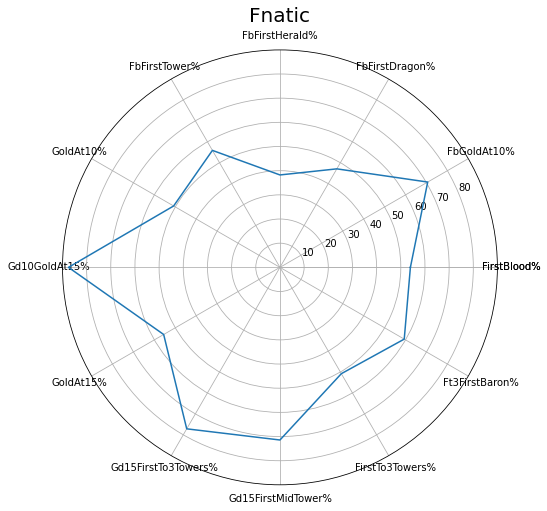

In [44]:
for i in range(len(labeledTeams)):
    label_0 = labeledTeams.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1 : -2]
    
    categories = labeledTeams.columns.tolist()
    categories = categories[1 : -2]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "team_graphs/" + team + "_earlygame.png"
    plt.savefig(figname)

In [45]:
top_cols = []
for column in blue_teams.columns:
    if column[:4] == 'bot_':
        top_cols.append(column)

In [46]:
top_cols

['bot_kills',
 'bot_deaths',
 'bot_assists',
 'bot_doublekills',
 'bot_triplekills',
 'bot_quadrakills',
 'bot_pentakills',
 'bot_firstbloodkill',
 'bot_damagetochampions',
 'bot_dpm',
 'bot_damageshare',
 'bot_damagetakenperminute',
 'bot_damagemitigatedperminute',
 'bot_wardsplaced',
 'bot_wpm',
 'bot_wardskilled',
 'bot_wcpm',
 'bot_controlwardsbought',
 'bot_visionscore',
 'bot_vspm',
 'bot_totalgold',
 'bot_earnedgold',
 'bot_earned gpm',
 'bot_earnedgoldshare',
 'bot_goldspent',
 'bot_total cs',
 'bot_minionkills',
 'bot_monsterkills',
 'bot_monsterkillsownjungle',
 'bot_monsterkillsenemyjungle',
 'bot_cspm',
 'bot_goldat10',
 'bot_xpat10',
 'bot_csat10',
 'bot_golddiffat10',
 'bot_xpdiffat10',
 'bot_csdiffat10',
 'bot_goldat15',
 'bot_xpat15',
 'bot_csat15',
 'bot_golddiffat15',
 'bot_xpdiffat15',
 'bot_csdiffat15']

### atributos compuestos por rol:
 - top
 - - top_firstbloodkill to first_herald %
 - - top_firstbloodkill to first_dragon %
 - - top_firstbloodkill to golddiffat10 %
 - - top_firstbloodkill to top_golddiffat10 %
 - - top_firstbloodkill to top_csdiffat10 %
 - - top_firstbloodkill to top_xpdiffat10 %
 - - top_firstbloodkill to firsttower
 - - top_golddiffat10 to top_golddiffat15
 - - top_golddiffat15 to result
 - - top_csdiffat10 to top_csdiffat15
 - - top_xpdiffat10 to top_xpdiffat15
 - - top_golddiffat15 firsttothreetowers
 - mid
 - - mid_firstbloodkill to first_herald %
 - - mid_firstbloodkill to first_dragon %
 - - mid_firstbloodkill to golddiffat10 %
 - - mid_firstbloodkill to mid_golddiffat10 %
 - - mid_firstbloodkill to mid_csdiffat10 %
 - - mid_firstbloodkill to mid_xpdiffat10 %
 - - mid_firstbloodkill to firsttower
 - - mid_golddiffat10 to mid_golddiffat15
 - - mid_golddiffat15 to result
 - - mid_csdiffat10 to mid_csdiffat15
 - - mid_xpdiffat10 to mid_xpdiffat15
 - - mid_golddiffat15 firsttothreetowers
 - bot
 - - bot_firstbloodkill to first_herald %
 - - bot_firstbloodkill to first_dragon %
 - - bot_firstbloodkill to golddiffat10 %
 - - bot_firstbloodkill to bot_golddiffat10 %
 - - bot_firstbloodkill to bot_csdiffat10 %
 - - bot_firstbloodkill to bot_xpdiffat10 %
 - - bot_firstbloodkill to firsttower
 - - bot_golddiffat10 to bot_golddiffat15
 - - bot_golddiffat15 to result
 - - bot_csdiffat10 to bot_csdiffat15
 - - bot_xpdiffat10 to bot_xpdiffat15
 - - bot_golddiffat15 firsttothreetowers

In [47]:
top_dependency = []
for team in team_list:
    blue_games = blue_teams[blue_teams['team'] == team]
    red_games = red_teams[red_teams['team'] == team]

    all_games = blue_games.append(red_games)
    
    fb_sum = all_games['top_firstbloodkill'].values.sum()
    fbpercentage = (fb_sum*100)/len(all_games)
    
    fbFhrldPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['firstherald'] == 1)])*100)/fb_sum
    fbFdrkdPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['firstdragon'] == 1)])*100)/fb_sum
    fbGd10Percentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fb_sum
    fbGd10topPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['top_golddiffat10'] > 0)])*100)/fb_sum
    fbCsdiffPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['top_csdiffat10'] > 0)])*100)/fb_sum
    fbXpdiffPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['top_xpdiffat10'] > 0)])*100)/fb_sum
    fbFtwrPercentage = (len(all_games[(all_games['top_firstbloodkill'] == 1) & (all_games['firsttower'] == 1)])*100)/fb_sum
    
    gd10sum = len(all_games[all_games['top_golddiffat10'] > 0])
    gd10Percentage = (gd10sum * 100)/len(all_games)
    
    gd10And15Percentage = (len(all_games[(all_games['top_golddiffat10'] > 0) & (all_games['top_golddiffat15'] >0)])*100)/gd10sum
    
    gd15sum = len(all_games[all_games['top_golddiffat15'] > 0])
    gd15Percentage = (gd15sum * 100)/len(all_games)
    
    gd15WrPercentage = (len(all_games[(all_games['top_golddiffat15'] > 0) & (all_games['result'] == 1)])*100)/gd15sum
    gd15Ft3Percentage = (len(all_games[(all_games['top_golddiffat15'] > 0) & (all_games['firsttothreetowers'] == 1)])*100)/gd15sum
    
    xp10sum = len(all_games[all_games['top_xpdiffat10'] > 0])
    xp10Percentage = (xp10sum *100)/len(all_games)
    
    xp10And15Percentage = (len(all_games[(all_games['top_xpdiffat10'] > 0) & (all_games['top_xpdiffat15'] >0)])*100)/xp10sum
    
    cs10sum = len(all_games[all_games['top_csdiffat10'] > 0])
    cs10Percentage = (cs10sum * 100)/len(all_games)
    
    cs10And15Percentage = (len(all_games[(all_games['top_csdiffat10'] > 0) & (all_games['top_csdiffat15'] >0)])*100)/cs10sum
    
    top_dependency.append([team, fbpercentage, fbFhrldPercentage, fbFdrkdPercentage, fbGd10Percentage, fbGd10topPercentage, fbCsdiffPercentage, fbXpdiffPercentage, fbFtwrPercentage, gd10Percentage, gd10And15Percentage, gd15Percentage, gd15WrPercentage, gd15Ft3Percentage, xp10Percentage,
                     xp10And15Percentage, cs10Percentage, cs10And15Percentage])
    
top_df = pd.DataFrame(top_dependency, columns = ['team', 'TopFb%', 'TopFbFirstHerald%', 'TopFbFirstDragon%', 'TopFbGoldAt10%', 'FbGoldAt10Top%', 'FbCsdiff%', 'FbXpdiff%', 'FbFirstTower%', 'topGd10%', 'topGd10Gd15%', 'topGd15%', 'topGd15Wr%', 'topGd15Firstto3%',
                                             'topXp10%', 'topXp10Xp15%', 'cs10%', 'cs10Cs15%'])
top_df

,team,TopFb%,TopFbFirstHerald%,TopFbFirstDragon%,TopFbGoldAt10%,FbGoldAt10Top%,FbCsdiff%,FbXpdiff%,FbFirstTower%,topGd10%,topGd10Gd15%,topGd15%,topGd15Wr%,topGd15Firstto3%,topXp10%,topXp10Xp15%,cs10%,cs10Cs15%
0,Suning,14.285714,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,57.142857,100.000000,71.428571,80.000000,80.000000,71.428571,100.000000,42.857143,66.666667
1,LGD Gaming,5.882353,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,100.000000,58.823529,90.000000,58.823529,70.000000,80.000000,64.705882,100.000000,52.941176,100.000000
2,MAD Lions,8.823529,83.333333,16.666667,66.666667,100.000000,83.333333,83.333333,66.666667,38.235294,73.076923,35.294118,50.000000,58.333333,38.235294,69.230769,32.352941,77.272727
3,PSG Talon,4.545455,100.000000,50.000000,100.000000,100.000000,100.000000,100.000000,100.000000,54.545455,70.833333,52.272727,73.913043,56.521739,72.727273,65.625000,65.909091,75.862069
4,Legacy Esports,13.636364,77.777778,44.444444,77.777778,100.000000,66.666667,44.444444,66.666667,69.696970,89.130435,69.696970,86.956522,71.739130,65.151515,86.046512,62.121212,87.804878
5,Team Liquid,5.000000,100.000000,66.666667,100.000000,100.000000,66.666667,100.000000,100.000000,51.666667,61.290323,43.333333,80.769231,69.230769,61.666667,67.567568,58.333333,68.571429
6,Rainbow7,6.666667,100.000000,25.000000,100.000000,100.000000,100.000000,75.000000,75.000000,61.666667,86.486486,56.666667,61.764706,70.588235,58.333333,77.142857,61.666667,81.081081
7,INTZ,6.557377,25.000000,50.000000,75.000000,75.000000,50.000000,50.000000,25.000000,45.901639,82.142857,45.901639,67.857143,67.857143,39.344262,75.000000,37.704918,73.913043
8,V3 Esports,3.773585,50.000000,50.000000,50.000000,100.000000,50.000000,100.000000,0.000000,47.169811,80.000000,47.169811,80.000000,84.000000,52.830189,71.428571,35.849057,68.421053
9,Unicorns Of Love.CIS,7.407407,25.000000,50.000000,75.000000,75.000000,50.000000,50.000000,50.000000,59.259259,87.500000,59.259259,93.750000,90.625000,53.703704,72.413793,46.296296,84.000000


<ipython-input-48-32ef4d79f897>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


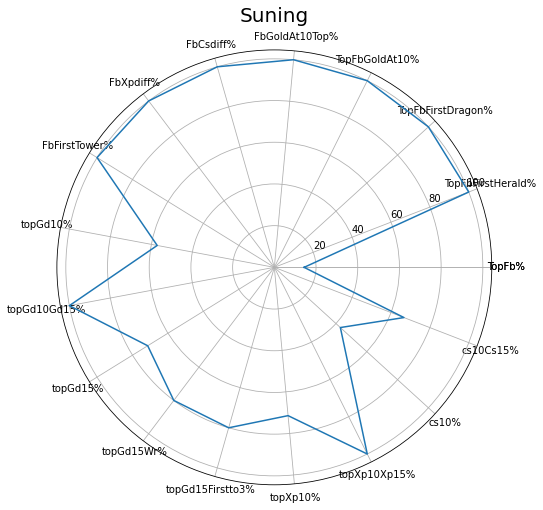

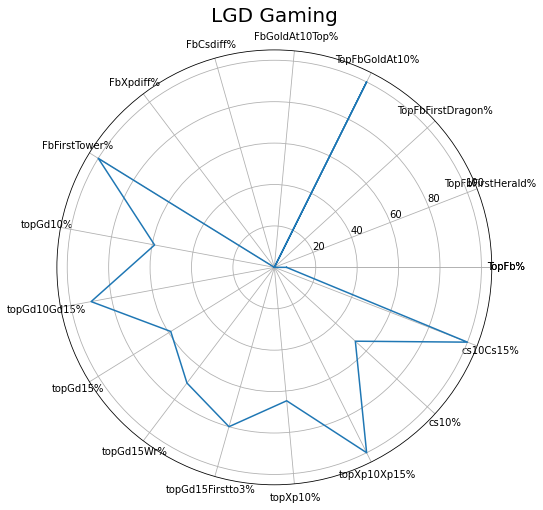

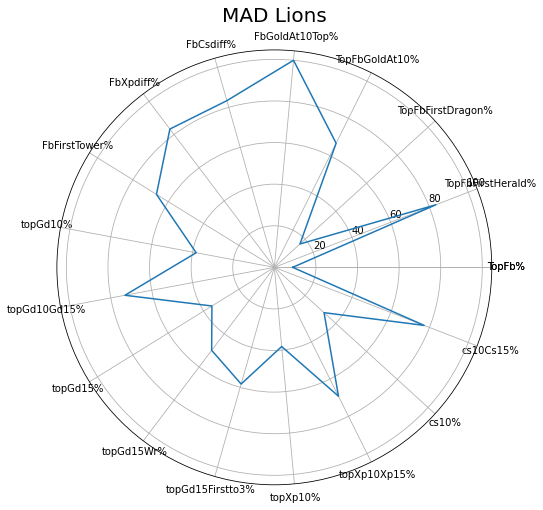

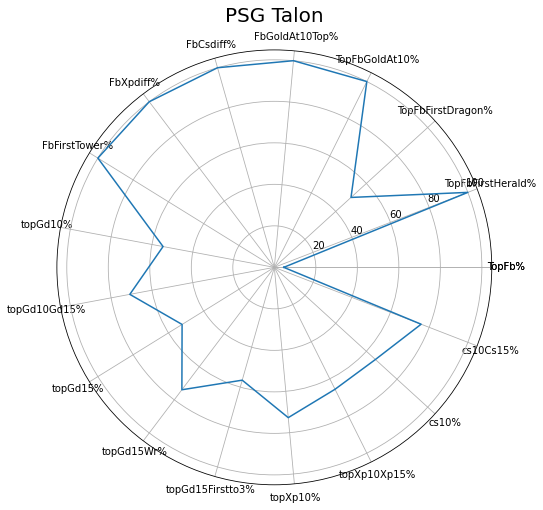

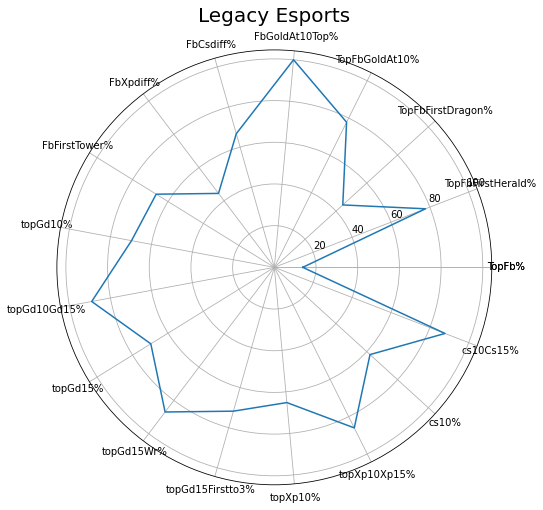

...

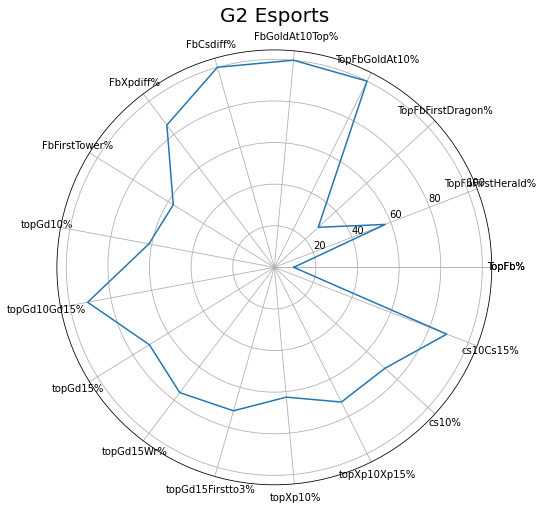

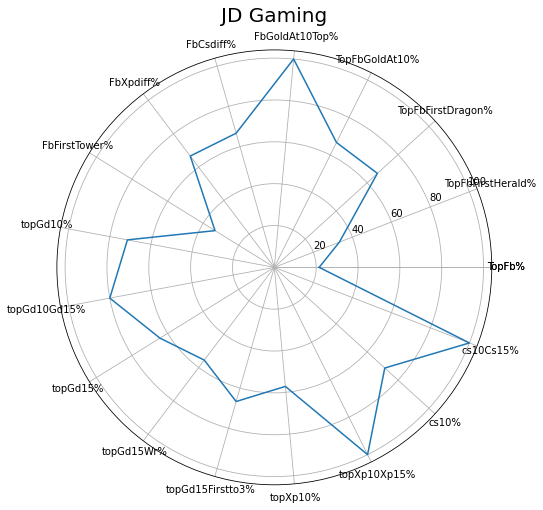

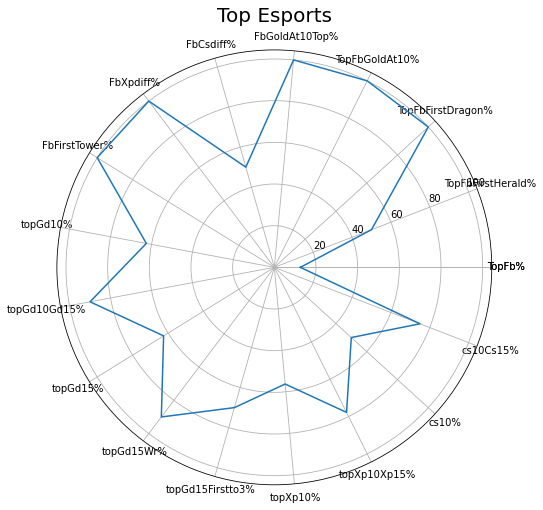

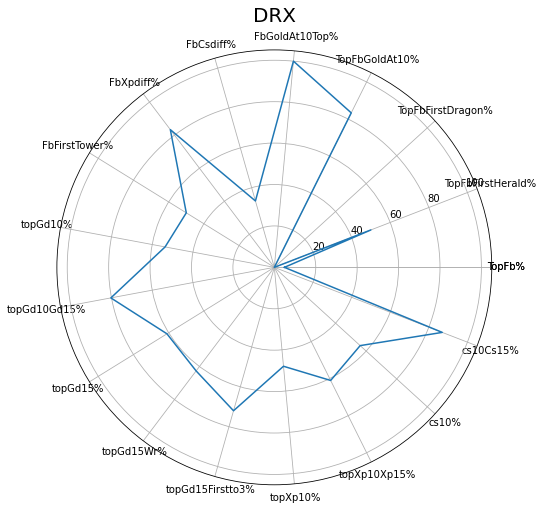

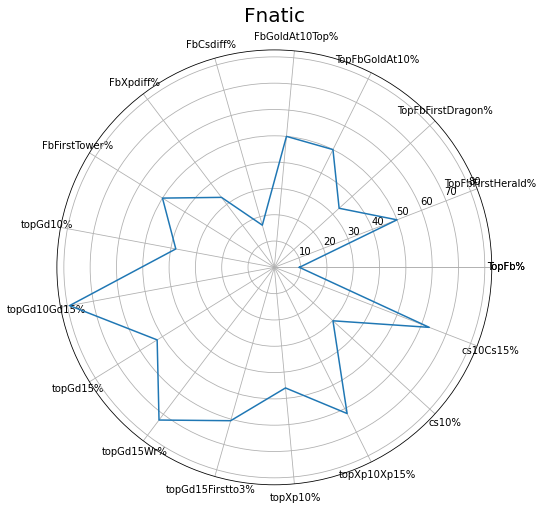

In [48]:
for i in range(len(top_df)):
    label_0 = top_df.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1:]
    
    categories = top_df.columns.tolist()
    categories = categories[1:]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "top_affinity/" + team + "_top_relliance.png"
    #plt.savefig(figname)

In [49]:
mid_dependency = []
for team in team_list:
    blue_games = blue_teams[blue_teams['team'] == team]
    red_games = red_teams[red_teams['team'] == team]

    all_games = blue_games.append(red_games)
    
    fb_sum = all_games['mid_firstbloodkill'].values.sum()
    fbpercentage = (fb_sum*100)/len(all_games)
    
    fbFhrldPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['firstherald'] == 1)])*100)/fb_sum
    fbFdrkdPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['firstdragon'] == 1)])*100)/fb_sum
    fbGd10Percentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fb_sum
    fbGd10topPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['mid_golddiffat10'] > 0)])*100)/fb_sum
    fbCsdiffPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['mid_csdiffat10'] > 0)])*100)/fb_sum
    fbXpdiffPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['mid_xpdiffat10'] > 0)])*100)/fb_sum
    fbFtwrPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['firsttower'] == 1)])*100)/fb_sum
    
    gd10sum = len(all_games[all_games['mid_golddiffat10'] > 0])
    gd10Percentage = (gd10sum * 100)/len(all_games)
    
    gd10And15Percentage = (len(all_games[(all_games['mid_golddiffat10'] > 0) & (all_games['mid_golddiffat15'] >0)])*100)/gd10sum
    
    gd15sum = len(all_games[all_games['mid_golddiffat15'] > 0])
    gd15Percentage = (gd15sum * 100)/len(all_games)
    
    gd15WrPercentage = (len(all_games[(all_games['mid_golddiffat15'] > 0) & (all_games['result'] == 1)])*100)/gd15sum
    gd15Ft3Percentage = (len(all_games[(all_games['mid_golddiffat15'] > 0) & (all_games['firsttothreetowers'] == 1)])*100)/gd15sum
    
    xp10sum = len(all_games[all_games['mid_xpdiffat10'] > 0])
    xp10Percentage = (xp10sum *100)/len(all_games)
    
    xp10And15Percentage = (len(all_games[(all_games['mid_xpdiffat10'] > 0) & (all_games['mid_xpdiffat15'] >0)])*100)/xp10sum
    
    cs10sum = len(all_games[all_games['mid_csdiffat10'] > 0])
    cs10Percentage = (cs10sum * 100)/len(all_games)
    
    cs10And15Percentage = (len(all_games[(all_games['mid_csdiffat10'] > 0) & (all_games['mid_csdiffat15'] >0)])*100)/cs10sum
    
    mid_dependency.append([team, fbpercentage, fbFhrldPercentage, fbFdrkdPercentage, fbGd10Percentage, fbGd10topPercentage, fbCsdiffPercentage, fbXpdiffPercentage, fbFtwrPercentage, gd10Percentage, gd10And15Percentage, gd15Percentage, gd15WrPercentage, gd15Ft3Percentage, xp10Percentage,
                     xp10And15Percentage, cs10Percentage, cs10And15Percentage])
    
mid_df = pd.DataFrame(mid_dependency, columns = ['team', 'MidFb%', 'MidFbFirstHerald%', 'MidFbFirstDragon%', 'MidFbGoldAt10%', 'FbGoldAt10Mid%', 'FbCsdiff%', 'FbXpdiff%', 'FbFirstTower%', 'MidGd10%', 'MidGd10Gd15%', 'MidGd15%', 'MidGd15Wr%', 'MidGd15Firstto3%',
                                             'MidXp10%', 'MidXp10Xp15%', 'cs10%', 'cs10Cs15%'])
mid_df

<ipython-input-49-74339353f721>:11: RuntimeWarning: invalid value encountered in double_scalars
  fbFhrldPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['firstherald'] == 1)])*100)/fb_sum
<ipython-input-49-74339353f721>:12: RuntimeWarning: invalid value encountered in double_scalars
  fbFdrkdPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['firstdragon'] == 1)])*100)/fb_sum
<ipython-input-49-74339353f721>:13: RuntimeWarning: invalid value encountered in double_scalars
  fbGd10Percentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fb_sum
<ipython-input-49-74339353f721>:14: RuntimeWarning: invalid value encountered in double_scalars
  fbGd10topPercentage = (len(all_games[(all_games['mid_firstbloodkill'] == 1) & (all_games['mid_golddiffat10'] > 0)])*100)/fb_sum
<ipython-input-49-74339353f721>:15: RuntimeWarning: invalid value encountered in double_scalars
  fbCsdiffPercentag

,team,MidFb%,MidFbFirstHerald%,MidFbFirstDragon%,MidFbGoldAt10%,FbGoldAt10Mid%,FbCsdiff%,FbXpdiff%,FbFirstTower%,MidGd10%,MidGd10Gd15%,MidGd15%,MidGd15Wr%,MidGd15Firstto3%,MidXp10%,MidXp10Xp15%,cs10%,cs10Cs15%
0,Suning,28.571429,50.000000,100.000000,100.000000,100.000000,50.000000,0.000000,50.000000,71.428571,80.000000,71.428571,80.000000,80.000000,42.857143,66.666667,71.428571,80.000000
1,LGD Gaming,23.529412,50.000000,25.000000,100.000000,100.000000,50.000000,75.000000,50.000000,76.470588,100.000000,88.235294,66.666667,80.000000,70.588235,83.333333,64.705882,100.000000
2,MAD Lions,11.764706,62.500000,25.000000,87.500000,87.500000,25.000000,50.000000,50.000000,58.823529,72.500000,52.941176,63.888889,58.333333,57.352941,58.974359,55.882353,76.315789
3,PSG Talon,11.363636,40.000000,40.000000,80.000000,80.000000,80.000000,80.000000,60.000000,61.363636,81.481481,54.545455,75.000000,70.833333,61.363636,77.777778,59.090909,80.769231
4,Legacy Esports,13.636364,66.666667,77.777778,88.888889,100.000000,33.333333,66.666667,88.888889,53.030303,74.285714,50.000000,90.909091,78.787879,51.515152,79.411765,39.393939,80.769231
5,Team Liquid,6.666667,75.000000,75.000000,75.000000,75.000000,50.000000,75.000000,75.000000,65.000000,82.051282,61.666667,70.270270,64.864865,66.666667,92.500000,61.666667,89.189189
6,Rainbow7,6.666667,25.000000,0.000000,100.000000,75.000000,100.000000,75.000000,25.000000,58.333333,91.428571,63.333333,55.263158,52.631579,56.666667,79.411765,63.333333,84.210526
7,INTZ,11.475410,57.142857,71.428571,71.428571,71.428571,28.571429,28.571429,57.142857,42.622951,80.769231,59.016393,58.333333,72.222222,36.065574,68.181818,32.786885,95.000000
8,V3 Esports,7.547170,75.000000,50.000000,75.000000,75.000000,25.000000,50.000000,50.000000,33.962264,66.666667,30.188679,75.000000,75.000000,30.188679,56.250000,24.528302,53.846154
9,Unicorns Of Love.CIS,18.518519,80.000000,50.000000,90.000000,90.000000,60.000000,70.000000,100.000000,62.962963,97.058824,79.629630,86.046512,86.046512,68.518519,83.783784,59.259259,87.500000


<ipython-input-50-f74a3a005910>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


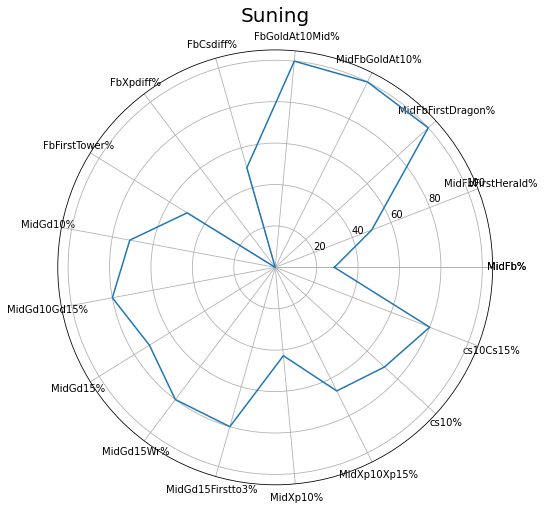

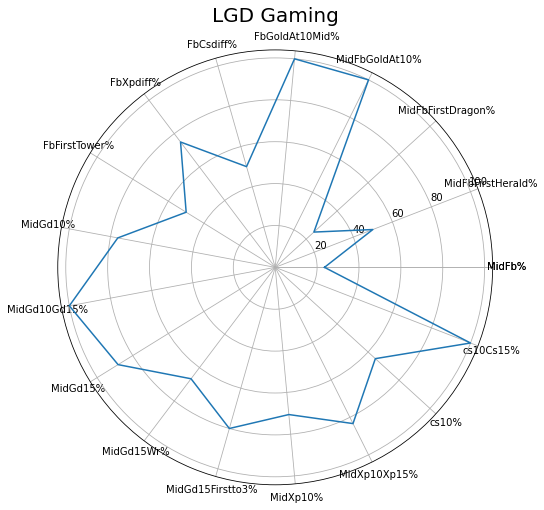

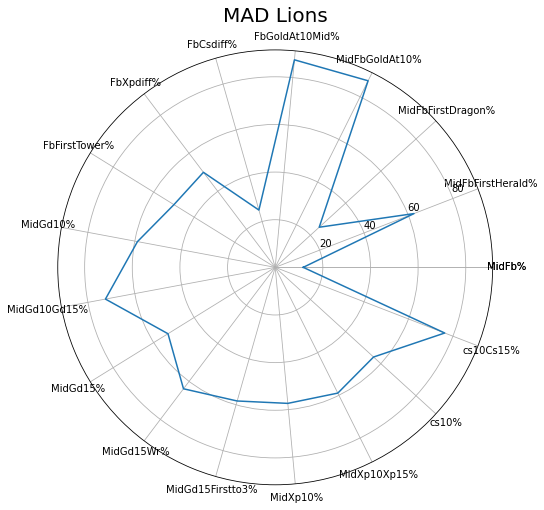

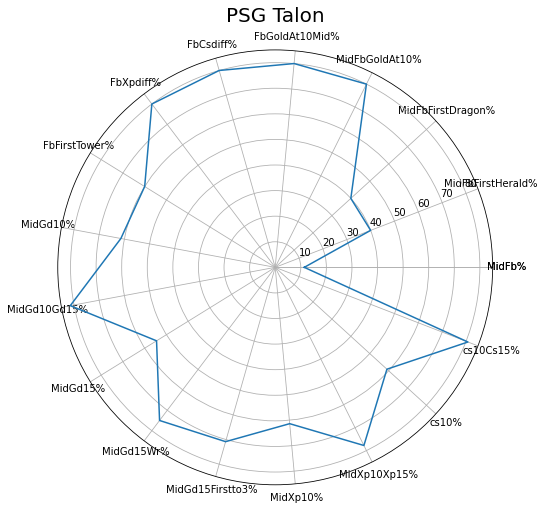

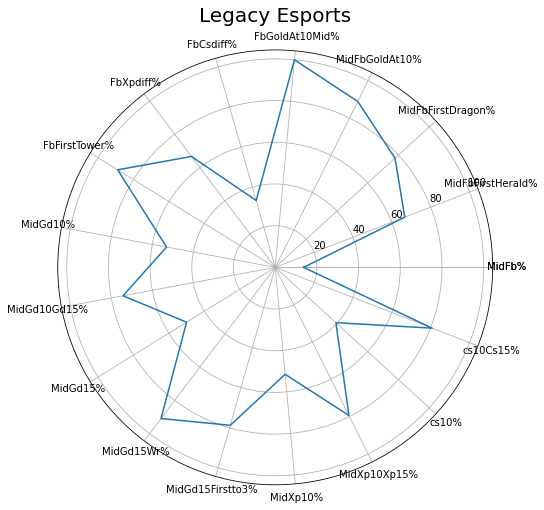

...

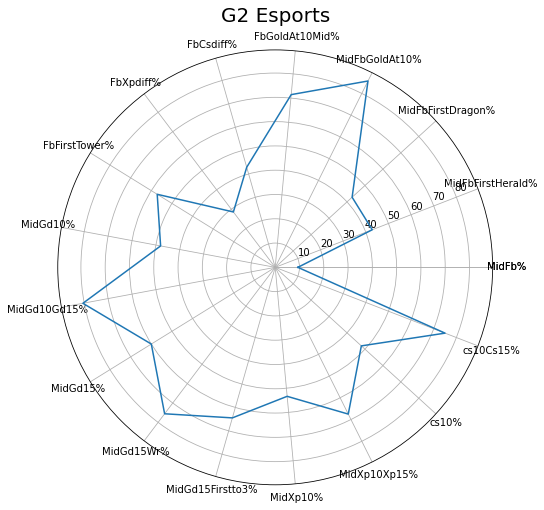

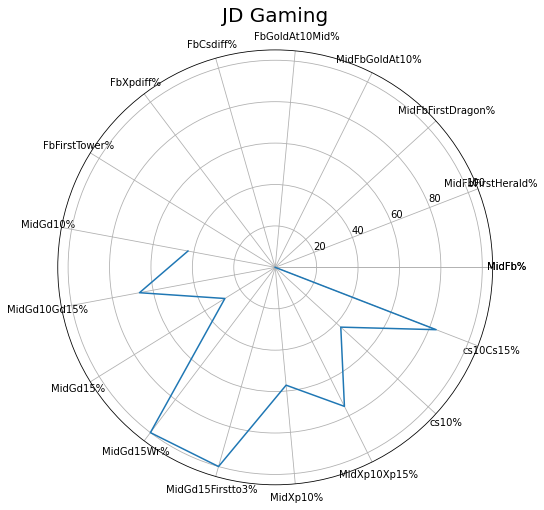

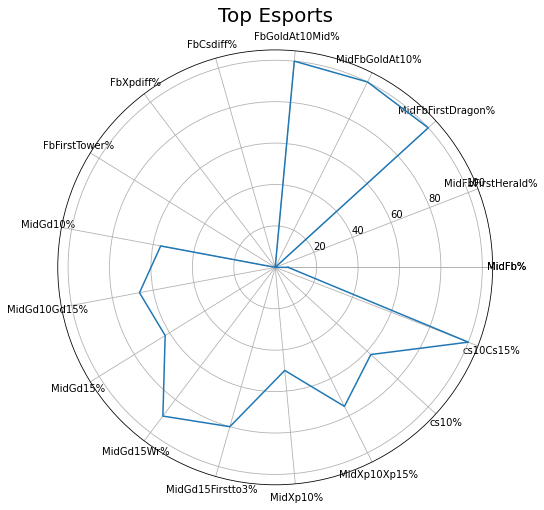

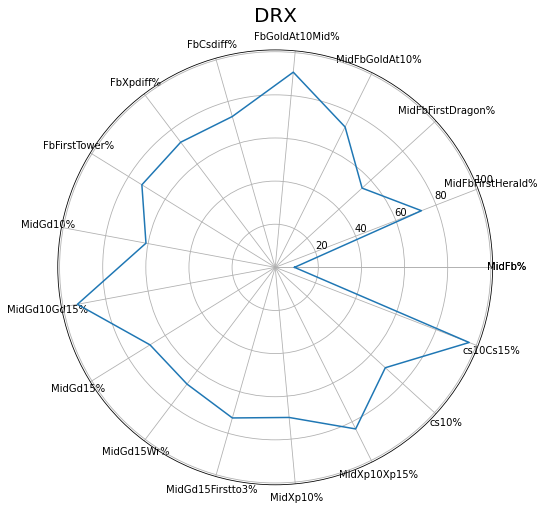

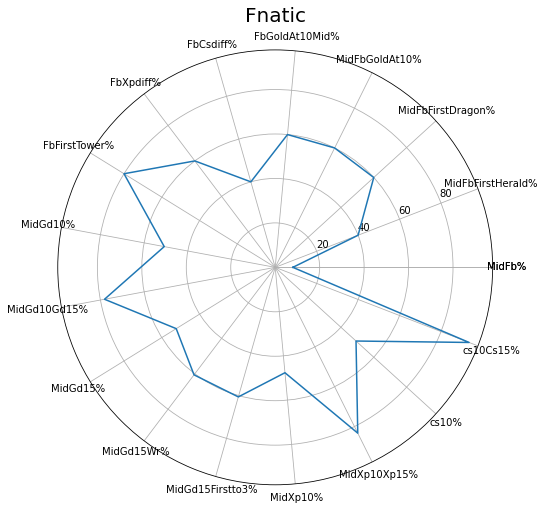

In [50]:
for i in range(len(mid_df)):
    label_0 = mid_df.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1:]
    
    categories = mid_df.columns.tolist()
    categories = categories[1:]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "mid_affinity/" + team + "_mid_relliance.png"
    #plt.savefig(figname)

In [51]:
bot_dependency = []
for team in team_list:
    blue_games = blue_teams[blue_teams['team'] == team]
    red_games = red_teams[red_teams['team'] == team]

    all_games = blue_games.append(red_games)
    
    fb_sum = all_games['bot_firstbloodkill'].values.sum()
    fbpercentage = (fb_sum*100)/len(all_games)
    
    fbFhrldPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['firstherald'] == 1)])*100)/fb_sum
    fbFdrkdPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['firstdragon'] == 1)])*100)/fb_sum
    fbGd10Percentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fb_sum
    fbGd10topPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['bot_golddiffat10'] > 0)])*100)/fb_sum
    fbCsdiffPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['bot_csdiffat10'] > 0)])*100)/fb_sum
    fbXpdiffPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['bot_xpdiffat10'] > 0)])*100)/fb_sum
    fbFtwrPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['firsttower'] == 1)])*100)/fb_sum
    
    gd10sum = len(all_games[all_games['bot_golddiffat10'] > 0])
    gd10Percentage = (gd10sum * 100)/len(all_games)
    
    gd10And15Percentage = (len(all_games[(all_games['bot_golddiffat10'] > 0) & (all_games['bot_golddiffat15'] >0)])*100)/gd10sum
    
    gd15sum = len(all_games[all_games['bot_golddiffat15'] > 0])
    gd15Percentage = (gd15sum * 100)/len(all_games)
    
    gd15WrPercentage = (len(all_games[(all_games['bot_golddiffat15'] > 0) & (all_games['result'] == 1)])*100)/gd15sum
    gd15Ft3Percentage = (len(all_games[(all_games['bot_golddiffat15'] > 0) & (all_games['firsttothreetowers'] == 1)])*100)/gd15sum
    
    xp10sum = len(all_games[all_games['bot_xpdiffat10'] > 0])
    xp10Percentage = (xp10sum *100)/len(all_games)
    
    xp10And15Percentage = (len(all_games[(all_games['bot_xpdiffat10'] > 0) & (all_games['bot_xpdiffat15'] >0)])*100)/xp10sum
    
    cs10sum = len(all_games[all_games['bot_csdiffat10'] > 0])
    cs10Percentage = (cs10sum * 100)/len(all_games)
    
    cs10And15Percentage = (len(all_games[(all_games['bot_csdiffat10'] > 0) & (all_games['bot_csdiffat15'] >0)])*100)/cs10sum
    
    bot_dependency.append([team, fbpercentage, fbFhrldPercentage, fbFdrkdPercentage, fbGd10Percentage, fbGd10topPercentage, fbCsdiffPercentage, fbXpdiffPercentage, fbFtwrPercentage, gd10Percentage, gd10And15Percentage, gd15Percentage, gd15WrPercentage, gd15Ft3Percentage, xp10Percentage,
                     xp10And15Percentage, cs10Percentage, cs10And15Percentage])
    
bot_df = pd.DataFrame(bot_dependency, columns = ['team', 'BotFb%', 'BotFbFirstHerald%', 'BotFbFirstDragon%', 'BotFbGoldAt10%', 'FbGoldAt10Bot%', 'FbCsdiff%', 'FbXpdiff%', 'FbFirstTower%', 'BotGd10%', 'BotGd10Gd15%', 'BotGd15%', 'BotGd15Wr%', 'BotGd15Firstto3%',
                                             'BotXp10%', 'BotXp10Xp15%', 'cs10%', 'cs10Cs15%'])
bot_df

,team,BotFb%,BotFbFirstHerald%,BotFbFirstDragon%,BotFbGoldAt10%,FbGoldAt10Bot%,FbCsdiff%,FbXpdiff%,FbFirstTower%,BotGd10%,BotGd10Gd15%,BotGd15%,BotGd15Wr%,BotGd15Firstto3%,BotXp10%,BotXp10Xp15%,cs10%,cs10Cs15%
0,Suning,14.285714,0.000000,100.000000,100.000000,0.000000,0.000000,100.000000,0.000000,28.571429,100.000000,57.142857,100.000000,100.000000,71.428571,100.000000,42.857143,100.000000
1,LGD Gaming,11.764706,50.000000,50.000000,100.000000,100.000000,0.000000,0.000000,100.000000,64.705882,54.545455,47.058824,75.000000,100.000000,52.941176,77.777778,52.941176,77.777778
2,MAD Lions,8.823529,50.000000,66.666667,66.666667,83.333333,66.666667,66.666667,66.666667,47.058824,87.500000,54.411765,56.756757,59.459459,44.117647,86.666667,41.176471,82.142857
3,PSG Talon,6.818182,100.000000,33.333333,66.666667,66.666667,66.666667,66.666667,66.666667,54.545455,87.500000,61.363636,70.370370,62.962963,47.727273,80.952381,59.090909,76.923077
4,Legacy Esports,6.060606,50.000000,100.000000,100.000000,100.000000,100.000000,75.000000,75.000000,63.636364,76.190476,62.121212,82.926829,65.853659,50.000000,75.757576,53.030303,82.857143
5,Team Liquid,13.333333,25.000000,75.000000,62.500000,100.000000,62.500000,87.500000,37.500000,53.333333,90.625000,68.333333,68.292683,60.975610,66.666667,77.500000,46.666667,92.857143
6,Rainbow7,11.666667,42.857143,57.142857,85.714286,100.000000,57.142857,85.714286,71.428571,45.000000,88.888889,53.333333,71.875000,62.500000,45.000000,74.074074,40.000000,83.333333
7,INTZ,11.475410,71.428571,14.285714,85.714286,85.714286,57.142857,71.428571,85.714286,31.147541,89.473684,39.344262,54.166667,75.000000,45.901639,78.571429,40.983607,80.000000
8,V3 Esports,15.094340,87.500000,75.000000,100.000000,100.000000,75.000000,75.000000,100.000000,64.150943,73.529412,49.056604,88.461538,80.769231,56.603774,73.333333,58.490566,80.645161
9,Unicorns Of Love.CIS,11.111111,83.333333,83.333333,100.000000,100.000000,83.333333,50.000000,83.333333,46.296296,80.000000,46.296296,92.000000,96.000000,51.851852,82.142857,37.037037,90.000000


<ipython-input-52-d6c98bb1455d>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


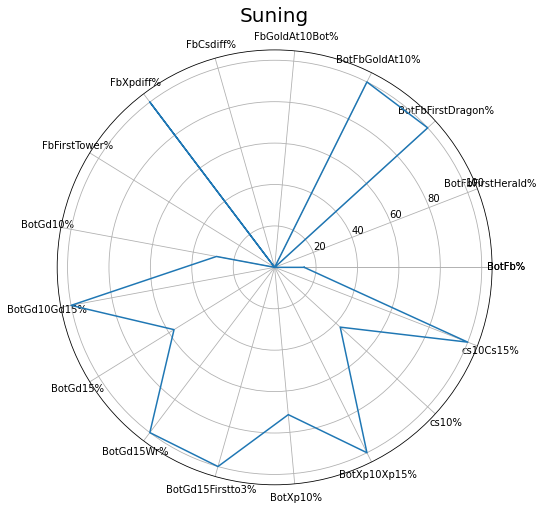

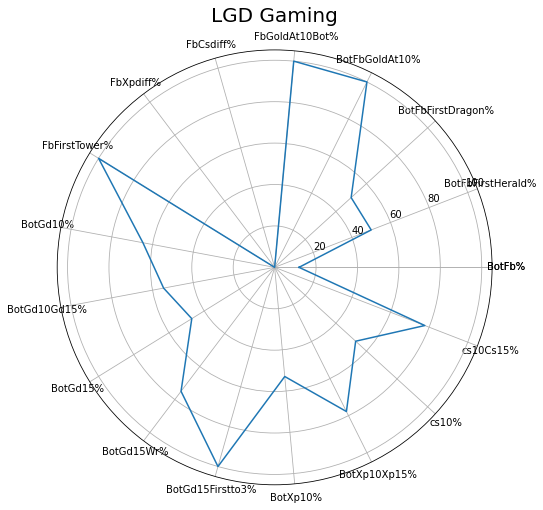

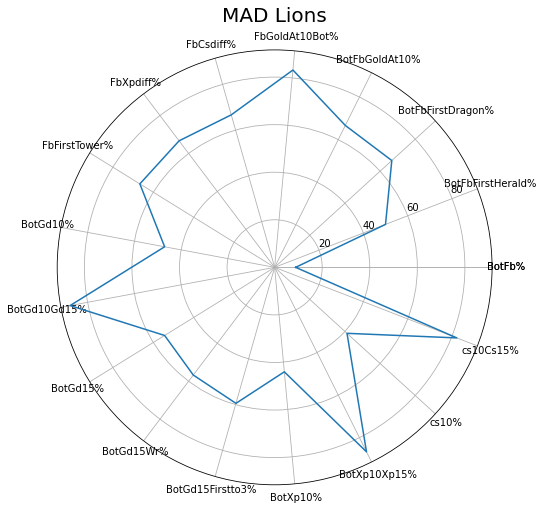

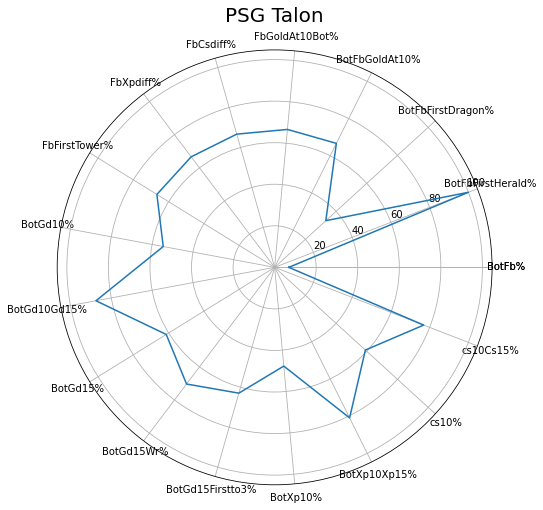

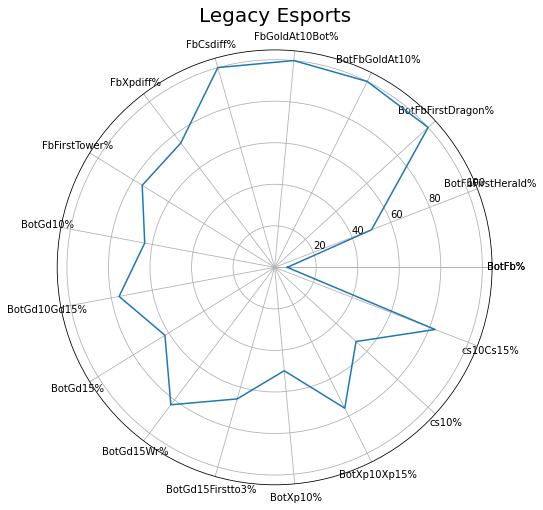

...

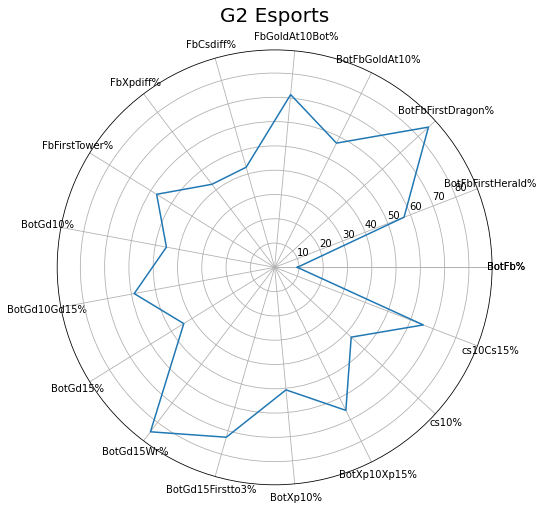

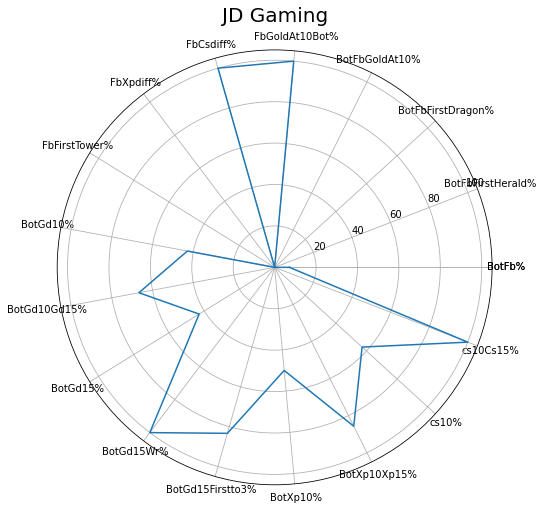

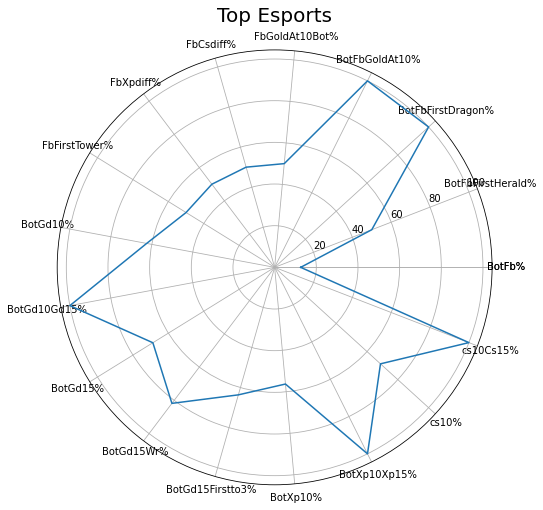

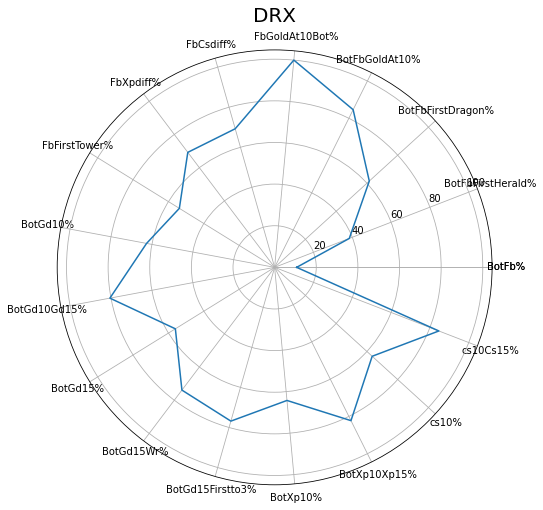

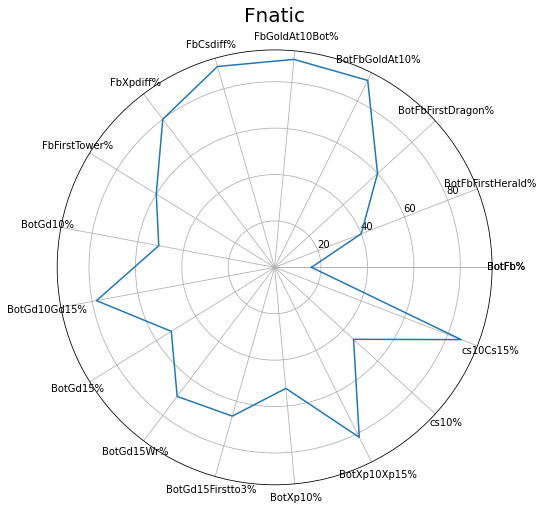

In [52]:
for i in range(len(bot_df)):
    label_0 = bot_df.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1:]
    
    categories = bot_df.columns.tolist()
    categories = categories[1:]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "bot_affinity/" + team + "_bot_relliance.png"
    #plt.savefig(figname)

In [53]:
#bot_df.to_csv("team_comp_df/bot_affinity.csv")

In [54]:
#mid_df.to_csv("team_comp_df/mid_affinity.csv")
#top_df.to_csv("team_comp_df/top_affinity.csv")
#df.to_csv("team_comp_df/team_early_performance.csv")

- jng_firstbloodkill %
- firstblood - first herald %
- firstblood - first dragon %
- firstblood - xpdiffat10 %
- firstblood - golddiffat10 team
- firstblood - golddiffat10 %
- firstblood - csdiffat10 %
- firstherald %
- firstdragon %
- golddiffat10 %
- xpdiffat10 %
- xp diffat10 - xpdiffat15 %
- csdiffat10 %
- csdiffat10 - csdiffat15 %
- jng_wpm
- jng_vspm
- jng_wardskilled per game
- jng_monsterkills per game

In [55]:
jng_dependency = []
for team in team_list:
    blue_games = blue_teams[blue_teams['team'] == team]
    red_games = red_teams[red_teams['team'] == team]

    all_games = blue_games.append(red_games)
    
    fb_sum = all_games['jng_firstbloodkill'].values.sum()
    #print(fb_sum)
    fbpercentage = (fb_sum*100)/len(all_games)
    
    fbFhrldPercentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['firstherald'] == 1)])*100)/fb_sum if fb_sum > 0 else 0
    fbFdrkdPercentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['firstdragon'] == 1)])*100)/fb_sum if fb_sum > 0 else 0
    fbGd10Percentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['golddiffat10'] > 0)])*100)/fb_sum if fb_sum > 0 else 0
    fbGd10topPercentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['jng_golddiffat10'] > 0)])*100)/fb_sum if fb_sum > 0 else 0
    fbCsdiffPercentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['jng_csdiffat10'] > 0)])*100)/fb_sum if fb_sum > 0 else 0
    fbXpdiffPercentage = (len(all_games[(all_games['jng_firstbloodkill'] == 1) & (all_games['jng_xpdiffat10'] > 0)])*100)/fb_sum if fb_sum > 0 else 0
    #fbFtwrPercentage = (len(all_games[(all_games['bot_firstbloodkill'] == 1) & (all_games['firsttower'] == 1)])*100)/fb_sum
    
    gd10sum = len(all_games[all_games['jng_golddiffat10'] > 0])
    gd10Percentage = (gd10sum * 100)/len(all_games)
    
    gd10And15Percentage = (len(all_games[(all_games['jng_golddiffat10'] > 0) & (all_games['jng_golddiffat15'] >0)])*100)/gd10sum
    
    gd15sum = len(all_games[all_games['jng_golddiffat15'] > 0])
    gd15Percentage = (gd15sum * 100)/len(all_games)
    
    gd15WrPercentage = (len(all_games[(all_games['jng_golddiffat15'] > 0) & (all_games['result'] == 1)])*100)/gd15sum
    #gd15Ft3Percentage = (len(all_games[(all_games['bot_golddiffat15'] > 0) & (all_games['firsttothreetowers'] == 1)])*100)/gd15sum
    
    xp10sum = len(all_games[all_games['jng_xpdiffat10'] > 0])
    xp10Percentage = (xp10sum *100)/len(all_games)
    
    xp10And15Percentage = (len(all_games[(all_games['jng_xpdiffat10'] > 0) & (all_games['jng_xpdiffat15'] >0)])*100)/xp10sum
    
    cs10sum = len(all_games[all_games['jng_csdiffat10'] > 0])
    cs10Percentage = (cs10sum * 100)/len(all_games)
    
    cs10And15Percentage = (len(all_games[(all_games['jng_csdiffat10'] > 0) & (all_games['jng_csdiffat15'] >0)])*100)/cs10sum
    
    fDragonPercentage = all_games['firstdragon'].sum()/len(all_games['firstdragon'])
    fHeraldPercentage = all_games['firstdragon'].sum()/len(all_games['firstherald'])
    
    enemyJgMonsters = all_games['jng_monsterkillsenemyjungle'].mean()
    jngWardsKilled = all_games['jng_wardskilled'].mean()
    
    jngWpm = all_games['jng_wpm'].mean()
    jngVspm = all_games['jng_vspm'].mean()
    
    jng_dependency.append([team, fbpercentage, fbFhrldPercentage, fbFdrkdPercentage, fbGd10Percentage, fbGd10topPercentage, fbCsdiffPercentage, fbXpdiffPercentage, gd10Percentage, gd10And15Percentage, gd15Percentage, gd15WrPercentage, xp10Percentage,
                     xp10And15Percentage, cs10Percentage, cs10And15Percentage, fDragonPercentage, fHeraldPercentage, enemyJgMonsters, jngWardsKilled, jngWpm, jngVspm])
    
jng_df = pd.DataFrame(jng_dependency, columns = ['team', 'JngFb%', 'JngFbFirstHerald%', 'JngFbFirstDragon%', 'JngFbGoldAt10%', 'FbGoldAt10Jng%', 'FbCsdiff%', 'FbXpdiff%', 'JngGd10%', 'JngGd10Gd15%', 'JngGd15%', 'JngGd15Wr%',
                                             'JngXp10%', 'JngXp10Xp15%', 'cs10%', 'cs10Cs15%', 'FirstDragon%', 'FirstHerald%', 'enemyMonstersPerGame', 'wardsKilledPerGame', 'wardsPerMinute', 'VisionScorePM'])
jng_df

,team,JngFb%,JngFbFirstHerald%,JngFbFirstDragon%,JngFbGoldAt10%,FbGoldAt10Jng%,FbCsdiff%,FbXpdiff%,JngGd10%,JngGd10Gd15%,JngGd15%,JngGd15Wr%,JngXp10%,JngXp10Xp15%,cs10%,cs10Cs15%,FirstDragon%,FirstHerald%,enemyMonstersPerGame,wardsKilledPerGame,wardsPerMinute,VisionScorePM
0,Suning,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,42.857143,100.000000,57.142857,75.000000,85.714286,83.333333,85.714286,83.333333,0.714286,0.714286,27.571429,25.142857,1.044871,2.673414
1,LGD Gaming,29.411765,80.000000,40.000000,80.000000,80.000000,40.000000,20.000000,47.058824,75.000000,47.058824,87.500000,23.529412,75.000000,41.176471,71.428571,0.529412,0.529412,16.529412,18.235294,0.393812,1.776300
2,MAD Lions,14.705882,80.000000,70.000000,80.000000,90.000000,80.000000,70.000000,45.588235,90.322581,51.470588,71.428571,45.588235,77.419355,48.529412,72.727273,0.455882,0.455882,12.147059,11.132353,0.463037,1.328722
3,PSG Talon,9.090909,100.000000,75.000000,100.000000,100.000000,50.000000,50.000000,54.545455,70.833333,47.727273,71.428571,61.363636,81.481481,61.363636,88.888889,0.500000,0.500000,14.522727,14.840909,0.486030,1.665016
4,Legacy Esports,19.696970,76.923077,46.153846,84.615385,61.538462,38.461538,53.846154,48.484848,87.500000,56.060606,89.189189,51.515152,79.411765,50.000000,81.818182,0.530303,0.530303,12.742424,11.272727,0.332153,1.353397
5,Team Liquid,11.666667,57.142857,57.142857,100.000000,100.000000,42.857143,42.857143,50.000000,80.000000,46.666667,75.000000,45.000000,77.777778,48.333333,68.965517,0.516667,0.516667,12.833333,11.866667,0.446295,1.397195
6,Rainbow7,21.666667,69.230769,46.153846,69.230769,92.307692,69.230769,92.307692,58.333333,94.285714,66.666667,65.000000,71.666667,88.372093,61.666667,81.081081,0.400000,0.400000,11.616667,18.183333,0.527030,1.764807
7,INTZ,18.032787,36.363636,54.545455,72.727273,63.636364,45.454545,63.636364,44.262295,81.481481,50.819672,58.064516,54.098361,72.727273,57.377049,77.142857,0.508197,0.508197,9.262295,13.459016,0.451239,1.527089
8,V3 Esports,33.962264,66.666667,55.555556,88.888889,88.888889,38.888889,61.111111,69.811321,86.486486,66.037736,74.285714,60.377358,87.500000,45.283019,91.666667,0.490566,0.490566,13.226415,13.886792,0.666555,1.689908
9,Unicorns Of Love.CIS,20.370370,72.727273,72.727273,63.636364,81.818182,63.636364,63.636364,55.555556,83.333333,59.259259,90.625000,53.703704,68.965517,46.296296,64.000000,0.611111,0.611111,14.537037,8.537037,0.351050,1.279622


In [56]:
#jng_df.to_csv("team_comp_df/jng_affinity.csv")

<ipython-input-57-de47152afad9>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


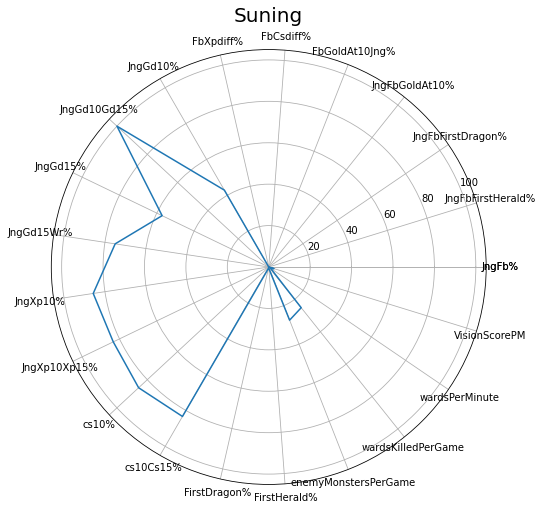

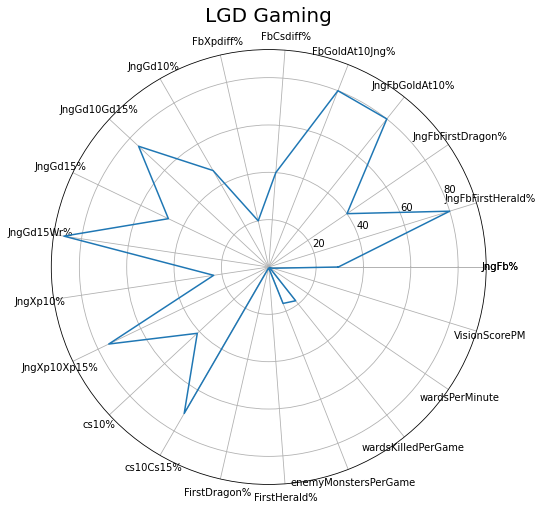

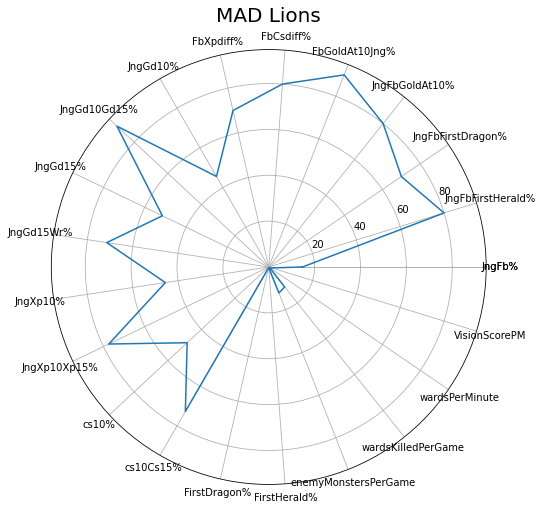

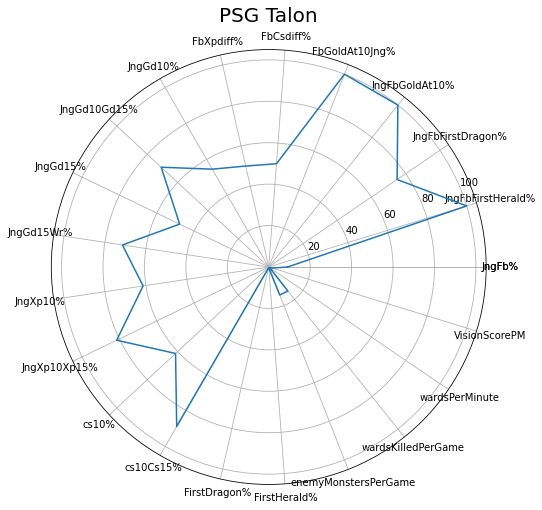

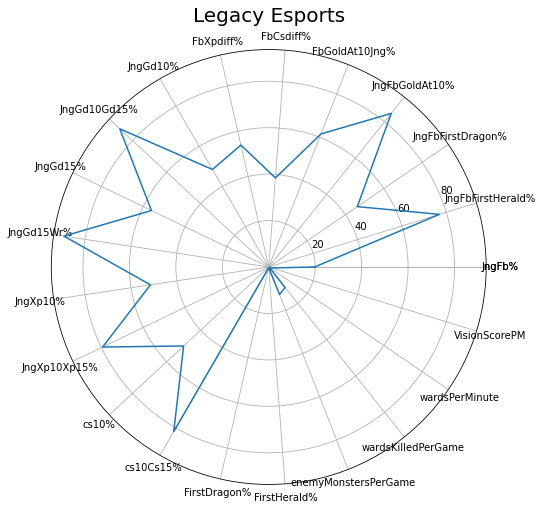

...

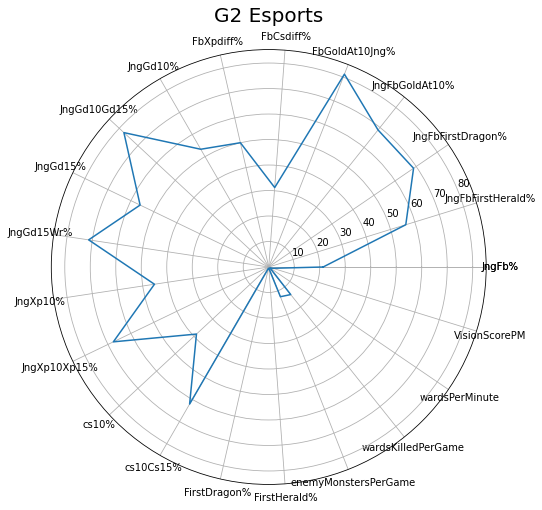

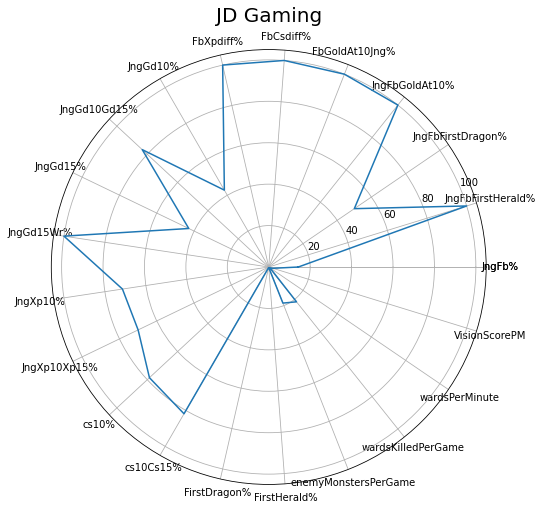

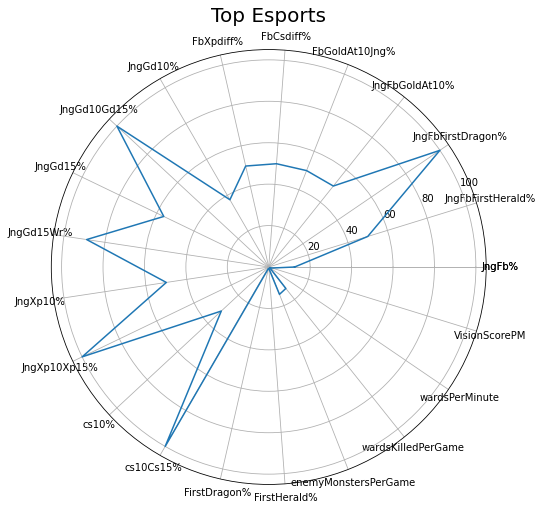

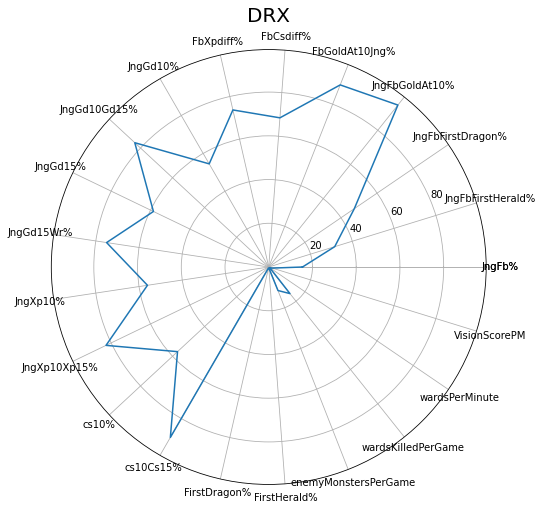

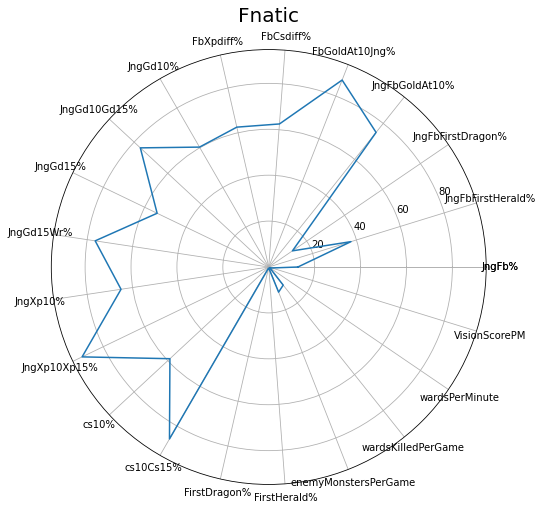

In [57]:
for i in range(len(jng_df)):
    label_0 = jng_df.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1:]
    
    categories = jng_df.columns.tolist()
    categories = categories[1:]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "jng_affinity/" + team + "_jng_relliance.png"
    #plt.savefig(figname)

In [58]:
supp_cols = []
for column in blue_teams.columns:
    if column[:4] == 'sup_':
        supp_cols.append(column)
        
supp_cols

['sup_kills',
 'sup_deaths',
 'sup_assists',
 'sup_doublekills',
 'sup_triplekills',
 'sup_quadrakills',
 'sup_pentakills',
 'sup_firstbloodkill',
 'sup_damagetochampions',
 'sup_dpm',
 'sup_damageshare',
 'sup_damagetakenperminute',
 'sup_damagemitigatedperminute',
 'sup_wardsplaced',
 'sup_wpm',
 'sup_wardskilled',
 'sup_wcpm',
 'sup_controlwardsbought',
 'sup_visionscore',
 'sup_vspm',
 'sup_totalgold',
 'sup_earnedgold',
 'sup_earned gpm',
 'sup_earnedgoldshare',
 'sup_goldspent',
 'sup_total cs',
 'sup_minionkills',
 'sup_monsterkills',
 'sup_monsterkillsownjungle',
 'sup_monsterkillsenemyjungle',
 'sup_cspm',
 'sup_goldat10',
 'sup_xpat10',
 'sup_csat10',
 'sup_golddiffat10',
 'sup_xpdiffat10',
 'sup_csdiffat10',
 'sup_goldat15',
 'sup_xpat15',
 'sup_csat15',
 'sup_golddiffat15',
 'sup_xpdiffat15',
 'sup_csdiffat15']

- damage to champions
- damagemitigatedperminute
- wardsplaced
- wpm
- wardskilled
- wardsbought
- visionscore
- vspm
- xpat10
- xpat10 xpat15

In [30]:
sup_stats = blue_teams.append(red_teams)

In [31]:
sup_stats = sup_stats[['team', 'sup_damageshare', 'sup_damagemitigatedperminute', 'sup_wardsplaced', 'sup_wpm', 'sup_wardskilled', 'sup_controlwardsbought', 'sup_visionscore', 'sup_vspm', 'sup_xpdiffat10', 'sup_xpdiffat15']]
#sup_stats

In [32]:
sup_dependency = []
for team in team_list:
    all_games = sup_stats[sup_stats['team'] == team]
    
    damageShare = all_games['sup_damageshare'].mean()
    damageMitigation = all_games['sup_damagemitigatedperminute'].mean()
    wardsPerGame = all_games['sup_wardsplaced'].mean()
    avgWardsPerMinute = all_games['sup_wpm'].mean()
    wardsKilledPerGame = all_games['sup_wardskilled'].mean()
    cWardsBought = all_games['sup_controlwardsbought'].mean()
    visionScorePerGame = all_games['sup_visionscore'].mean()
    avgVSPerMinute = all_games['sup_vspm'].mean()
    
    sup_dependency.append([team, damageShare, damageMitigation, wardsPerGame, avgWardsPerMinute, wardsKilledPerGame, cWardsBought, visionScorePerGame, avgVSPerMinute])
    
sup_df = pd.DataFrame(sup_dependency, columns = ['team', 'supDamageSharePerGame', 'supDamageMitigatedPerGame', 'supWardsPlacedPerGame', 'supAvgWardsPerMinute', 'supWardsKilledPerGame', 'supCWardsBought', 'supVSPerGame', 'supAvgVSPerMinute'])

In [33]:
sup_df

,team,supDamageSharePerGame,supDamageMitigatedPerGame,supWardsPlacedPerGame,supAvgWardsPerMinute,supWardsKilledPerGame,supCWardsBought,supVSPerGame,supAvgVSPerMinute
0,Suning,0.069398,612.341886,60.000000,1.805486,12.857143,16.142857,96.142857,2.866329
1,LGD Gaming,0.074063,530.208429,64.882353,1.851118,16.941176,16.117647,108.588235,3.118665
2,MAD Lions,0.087355,519.673603,52.691176,1.610087,12.191176,16.352941,86.911765,2.656940
3,PSG Talon,0.078383,443.739536,49.840909,1.508134,13.227273,14.704545,85.522727,2.599648
4,Legacy Esports,0.099269,356.348918,47.242424,1.456517,9.151515,13.954545,77.454545,2.405444
5,Team Liquid,0.075478,412.133622,54.500000,1.525832,16.383333,13.983333,103.100000,2.897820
6,Rainbow7,0.099705,497.915287,54.350000,1.473885,12.716667,17.283333,92.150000,2.523805
7,INTZ,0.087660,529.178277,55.852459,1.638836,12.655738,18.229508,89.377049,2.634113
8,V3 Esports,0.074450,512.291204,44.660377,1.305183,10.849057,14.811321,75.226415,2.236423
9,Unicorns Of Love.CIS,0.078402,599.289924,36.851852,1.241030,9.629630,11.074074,66.666667,2.272022


In [34]:
#sup_df.to_csv("team_comp_df/sup_affinity.csv")

<ipython-input-37-efcf75f2097d>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


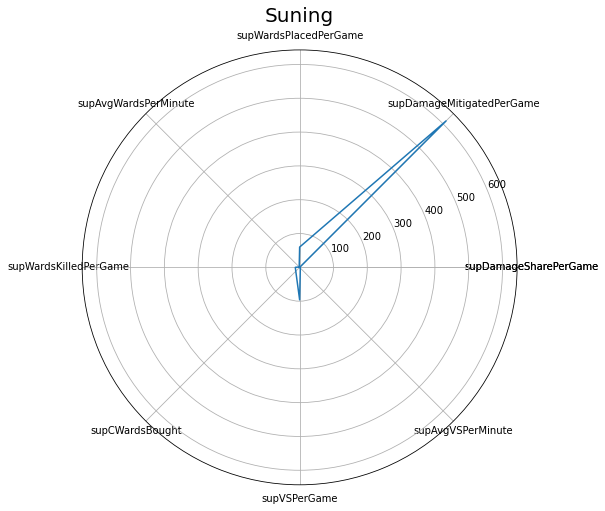

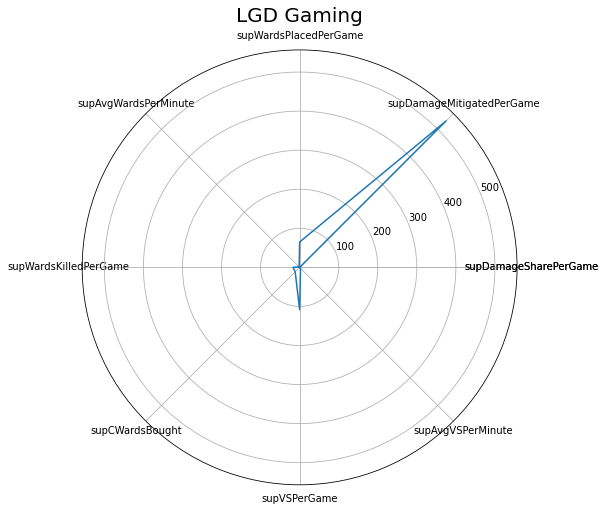

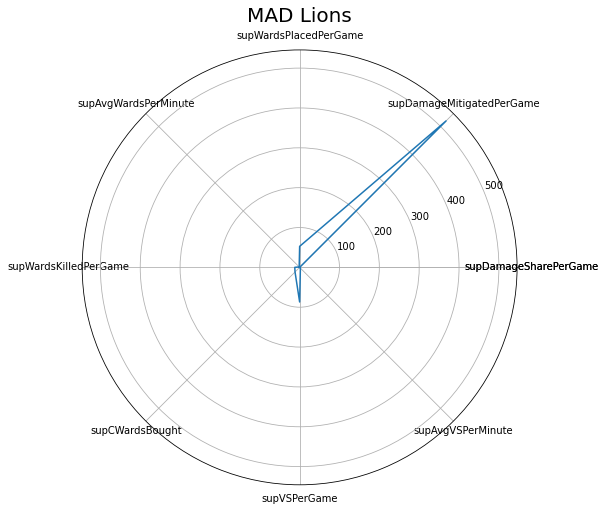

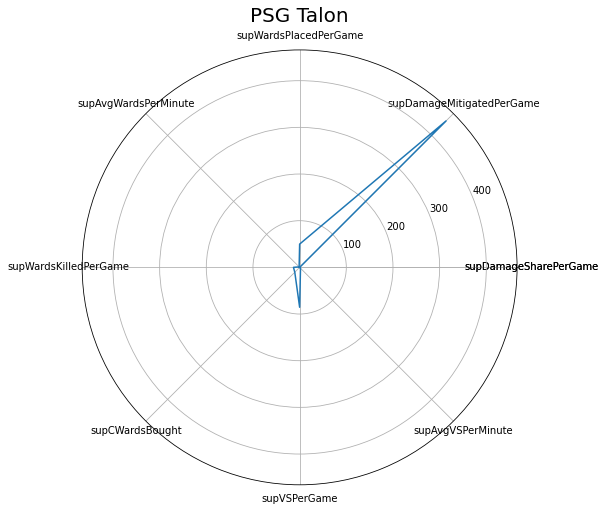

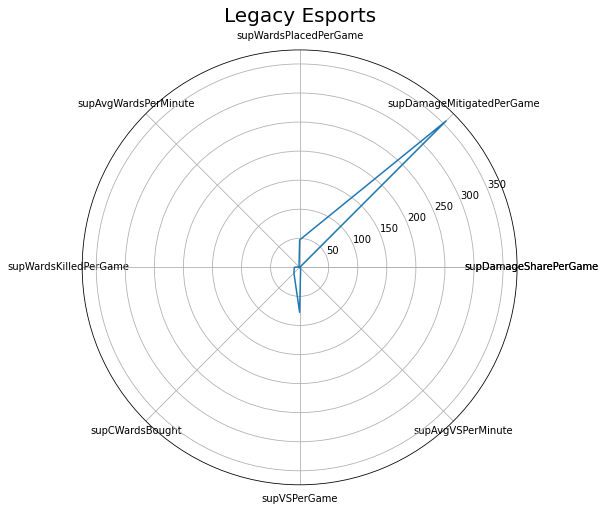

...

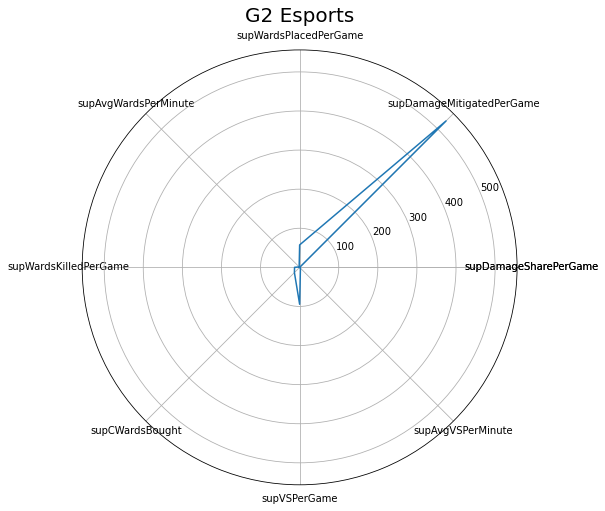

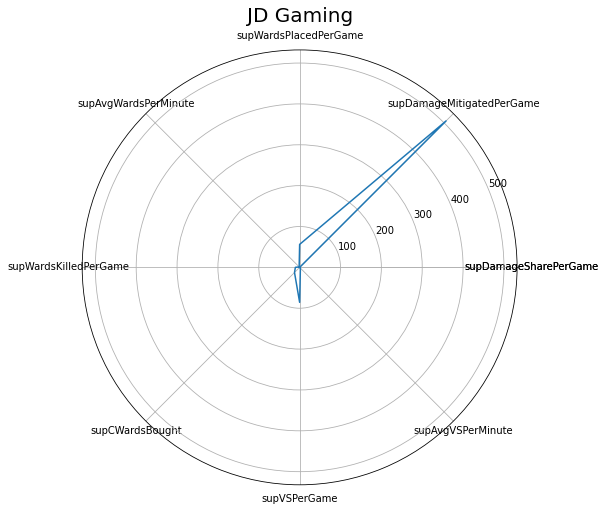

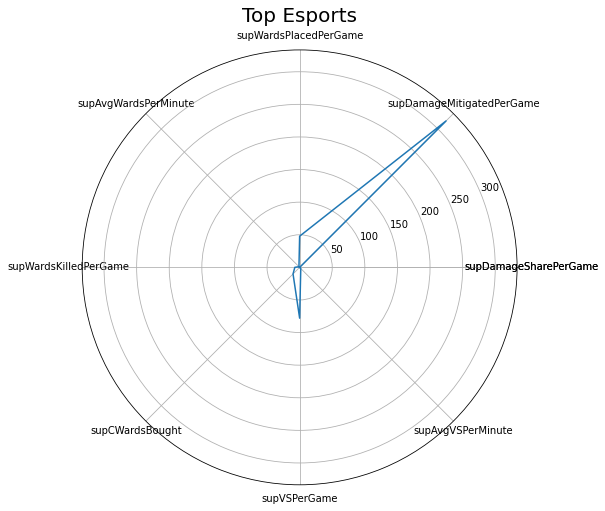

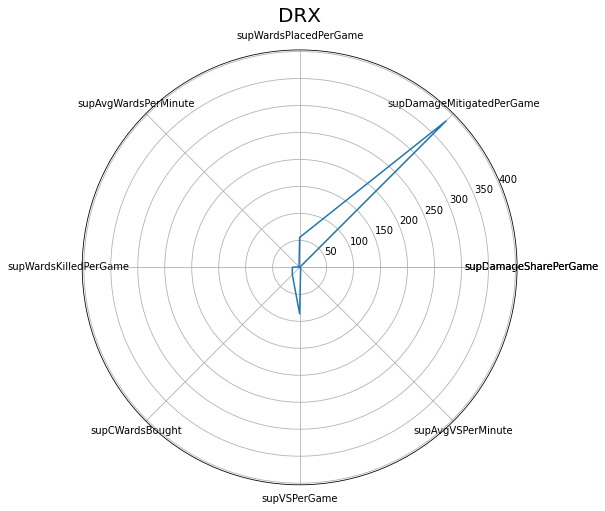

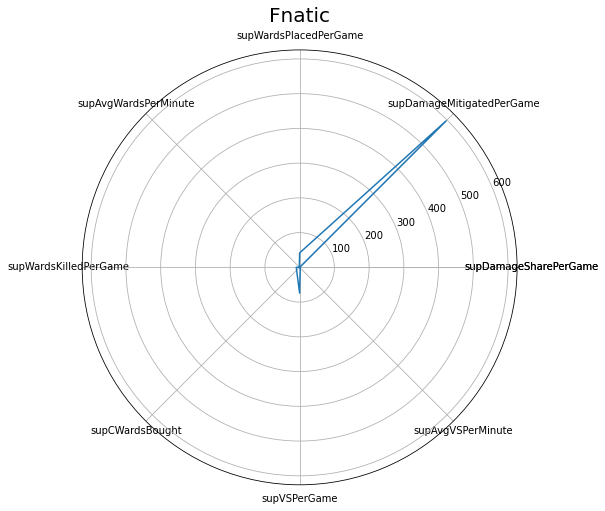

In [37]:
for i in range(len(sup_df)):
    label_0 = sup_df.iloc[i].values.tolist()
    team = label_0[0]
    label_0 = label_0[1:]
    
    categories = sup_df.columns.tolist()
    categories = categories[1:]
    categories = [*categories, categories[0]]
    
    type_0 = [*label_0, label_0[0]]
    
    label_loc = np.linspace(start = 0, stop = 2*np.pi, num = len(type_0))
    
    plt.figure(figsize = (8,8))
    plt.subplot(polar = True)
    plt.plot(label_loc, type_0, label = 'type_0')
    plt.title(team, size = 20, y = 1.05)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels = categories)
    plt.legend
    figname = "sup_affinity/" + team + "_sup_relliance.png"
    plt.savefig(figname)